# 13-1. 들어가며

### Face detection, 얼마나 작고 빨라질 수 있을까?
---
지난 시간까지 카메라 스티커앱을 만들면서 이미지 속의 얼굴을 빠르고 정확하게 인식하는 방법에 대해 고민해 왔습니다. 첫번째로 고려해본 방법은 Dlib 라이브러리를 이용해서 Face Landmark를 찾아내는 것이었습니다. 하지만 그것만으로는 충분하지 않았었죠.

이번 시간에는 Dlib 얼굴 인식에서 개선해 볼 포인트와 YOLO, SSD 등 Face Detection을 위한 딥러닝 모델들에 대해 같이 알아보는 시간을 가져볼게요.

본격적으로 시작하기에 앞서 아래 그림을 한 번 보실까요? 5개의 모델의 성능을 비교한 그림인데요, 가로 축은 inference time 즉, 인공지능 모델이 학습된 후 새로운 데이터를 입력 받아 예측하는 데 소요되는 시간을 나타내며, 세로 축은 mAP 지표로 Object Detection 분야에서 자주 사용되는 성능 지표로서 높을 수록 좋은 성능을 나타냅니다.

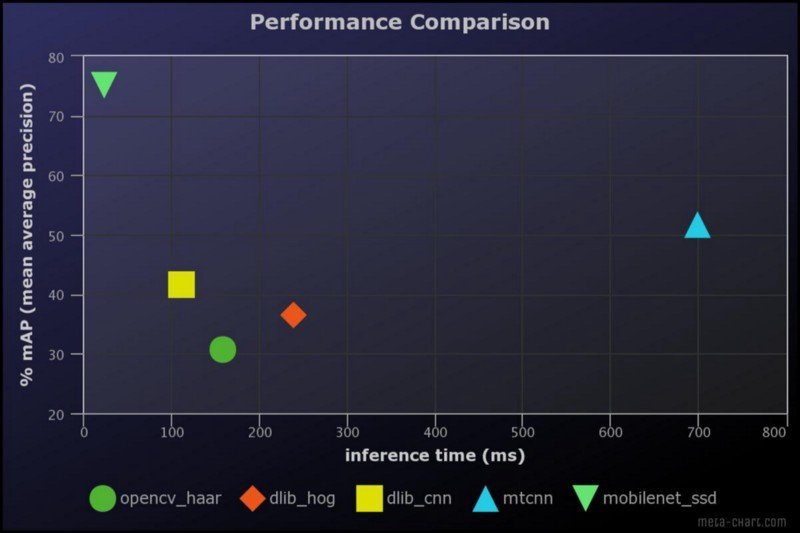
[openCV_Haar, dlib_hog는 CPU로 dlib_cnn, mtcnn, mobilenet_ssd는 GPU로 돌린 실험 결과(inference time)]
https://seongkyun.github.io/study/2019/03/25/face_detection/  

##[아이스브레이킹] 만약 우리가 실시간 처리를 위해서 사진에서 주어진 5개 모델 중 하나를 활용해야 한다면, 어떤 모델이 가장 적합할까요?  
mobilenet_ssd

### 학습 목표
---
- dlib을 활용한 얼굴 인식 방법에서 개선해야 할 포인트를 스스로 체크할 수 있습니다.
- YOLO, SSD 등 성능 개선을 위한 딥러닝 모델에 대해 이해할 수 있습니다.
- SOTA Face Detection 모델들을 설명할 수 있습니다.

### 학습 내용
2. Dlib 얼굴 인식의 문제점
- dlib 라이브러리를 이용하여 얼굴의 랜드마크를 찾아낼 때의 문제점을 짚어보아요.
3. Single Stage Object Detection
- 2-stage detector에 비해 상대적으로 속도가 빠른 1-stage 기반의 모델들을 공부해봅시다.
4. YOLO(1) YOLO v1의 등장
- Object Detection의 획기적인 발전을 이끌게 된 YOLO 모델의 개요를 살펴보아요.
5. YOLO(2) YOLO v1의 원리
- YOLO v1의 특징과 원리에 대해 공부해봅시다.
6. YOLO(3) YOLO v1의 성능
- YOLO v1의 loss function에 대해 이해하고, 모델 성능에 대해 이해해봅시다.
7. YOLO(4) YOLO v2
- YOLO v1에서 정확도를 더 끌어올린 YOLO v2에 대해 알아보고, 무엇이 달라졌는지 확인해보아요.
8. YOLO(5) YOLO v3
- YOLO v3의 원리와 전체적인 모델의 아키텍쳐에 대해 공부해봅시다.
9. YOLO v3 그 이후
- YOLO v3 이후에는 어떻게 버전 업이 되었는지 볼까요?
10. SSD(1) SSD의 특징
- YOLO v1의 단점을 보완하기 위해 SSD에서 제안한 테크닉들을 살펴보아요.
11. SSD(2) SSD의 Loss와 성능
- SSD의 loss function에 대해 이해하고, 모델 성능에 대해 이해해봅시다.
12. Face Detection을 위한 모델들
- YOLO와 SSD 외에도 SOTA Face Detection 모델들에 대해 알아보아요.

# 13-2. Dlib 얼굴 인식의 문제점

Q. Dlib 라이브러리를 이용해 Face Landmark를 찾아낼 때의 문제점은 무엇이었나요?
얼굴을 잘 못 찾는다.  
동영상을 처리하기엔 너무 느리다.  
얼굴각도, 방향, 크기 등의 변화에 취약하다.  
그 외에도 많은 문제점을 발견할 수 있다.  

### 왜 작아지고 빨라지는 게 중요할까요?
---
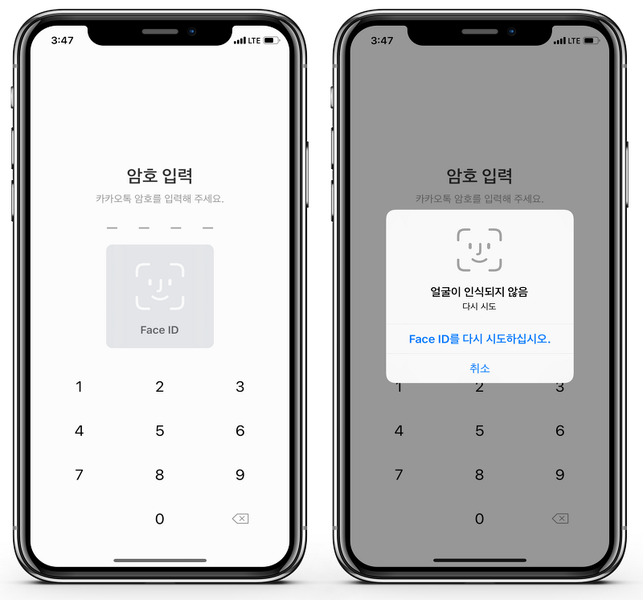  

우선 비대면 인증수단으로 얼굴인식이 보편적으로 사용되기 시작했다는 점을 들 수 있습니다. 얼굴 인식을 위해 딥러닝 서버 구동이 필요한 모델을 활용할 수 있을까요?

서버로 이미지를 보낸 후 처리하는 방식은 네트워크 비용 + 서버 비용 + 인터넷 속도의 영향을 고려하지 않을 수 없습니다. 따라서 네트워크 상황과 무관하게 항상 동작해야 하는 핸드폰 인증 수단으로는 적합하지 않습니다. 그렇다면 edge device(= 핸드폰)를 바로 이용하려면 어떻게 해야 할까요?

핸드폰에 모델을 올리려면 weight가 작은 모델이 관리에 유리합니다. 하지만 일반적으로 작은 모델은 성능이 떨어지기 때문에 어떻게 보완할 수 있을지 고민이 시작됩니다.

국내 IT 대기업들도 관련 연구를 활발히 진행하고 있습니다. 아랫글들을 통해 상세한 내용을 참고하시기 바랍니다.

- 카카오 얼굴인식 관련 리서치 https://tech.kakaoenterprise.com/63
- 네이버 얼굴검출 관련 오픈소스 https://github.com/clovaai/EXTD_Pytorch

### 어떻게 빠르게 만들 수 있을까요?
---
Face detection에서 많은 시간이 드는 요소는 Sliding window입니다. 그러므로 Sliding window를 버려야 빨라집니다. 따라서 2-stage 방식의 detection은 좋은 선택이 아닙니다.

또 연산의 병렬화가 가능해야 합니다. 컴퓨터의 GPU에서는 병렬화가 가능하지만 핸드폰에서도 병렬화가 가능할까요?

크게는 안드로이드와 아이폰의 경우로 나누어 생각해볼 수 있습니다. 안드로이드에서는 MLKit, 아이폰에서는 CoreML이라는 라이브러리를 통해 병렬화를 할 수 있습니다. 하지만 제한이 많기 때문에 TFLite라는 도구를 이용하여 훈련된 모델을 이용하기도 합니다.

- Core ML https://developer.apple.com/documentation/coreml
- ios 11 machine learning for everyone https://machinethink.net/blog/ios-11-machine-learning-for-everyone/
- ML kit https://developers.google.com/ml-kit?hl=ko
- TFLite https://ai.google.dev/edge/litert?hl=ko

위 방법으로도 해결이 안 된다면 어렵더라도 다른 방법을 생각해봐야 합니다. 우선 직접 병렬프로그래밍 라이브러리를 만들어 볼 수 있겠네요~! 하지만 그 난이도는 어마어마하겠죠? 비교적 쉬운 방법으로는 병렬화 도구를 사용하는 방법이 있습니다.

- SIMD-병렬-프로그래밍 https://modulabs.co.kr/blog/simd-programming
- OpenCL https://www.khronos.org/opencl/
- Android: Open GL ES https://developer.android.com/develop/ui/views/graphics/opengl/about-opengl?hl=ko

하지만 무엇보다도 적은 파라미터 수로도 정확한 성능을 가지는 모델을 설계하는 게 중요하겠죠? 다음 스텝부터 알아보도록 합시다.

# 13-3. Single Stage Object Detection

아마도 여러분은 2-Stage Detector은 정확도는 높지만 실행속도(FPS)가 느리다는 것을 이미 공부해서 알고 있을 것입니다.

간단히 정리하자면 2-Stage Detector는 물체가 존재하는 bounding box를 먼저 찾은(localization) 후에 bounding box를 분류(classification)하는 두 가지 과정을 순차적으로 거쳤기 때문에, 속도가 느렸습니다.

하지만 이전 스텝에서 살펴본 것처럼, 얼굴 인식과 같이 딥러닝 모델이 가벼워야 하는 task는 1-Stage 기반을 사용하는 것이 유리합니다. 1-Stage Detector는 localization과 classification을 동시에 수행합니다. 따라서 2단계를 거치는 2-Stage Detector보다는 속도가 빠릅니다. 하지만 정확도가 낮다는 단점도 있습니다.

아래의 그림에서 2-Stage Detector와 1-Stage Detector에 해당하는 모델이 어떤 것이 있는지 볼 수 있습니다.  

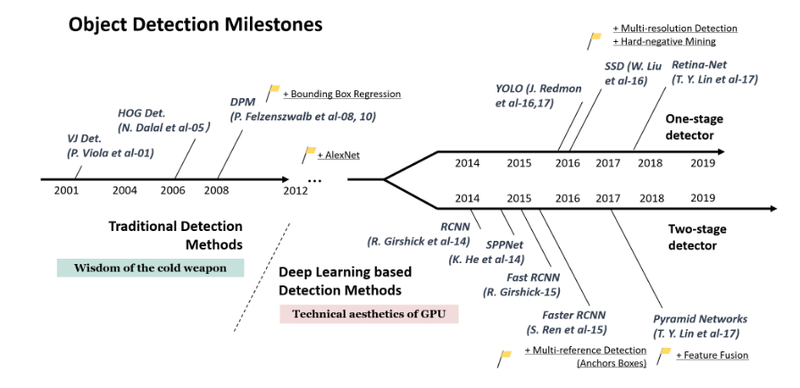  


#### Q. 1-Stage Detector와 2-Stage-Detector의 차이점은 무엇인가요?
1-Stage Detector는 물체의 위치와 클래스를 한번에 예측하는 모델이며, 2-Stage Detector는 물체의 위치와 클래스를 예측하는 과정을 두 단계로 나눈 모델입니다. 즉, 1-Stage Detector는 단일 네트워크를 이용하여 물체 검출을 수행하는 반면, 2-Stage Detector는 여러 개의 네트워크를 이용하여 검출을 수행합니다.

1-Stage Detector가 2-Stage Detector보다 상대적으로 속도는 빠르지만, 정확도가 낮다는 특징이 있습니다.

혹시 이전에 공부했던 Object Detection과 관련해서 복습이 필요하다면 아래 참고자료를 활용해 주세요.

- Fast Detection Models https://lilianweng.github.io/posts/2018-12-27-object-recognition-part-4/
- 단일 샷 탐지기 (Single Shot Detector) https://modulabs.co.kr/blog/single-shot-detector

이후 스텝에서 우리는 1-stage(Single stage) Object detection 모델을 위주로 하여 Face detection에 적합한 딥러닝 모델들에 대해 탐색해 보겠습니다. YOLO, SSD, RetinaNet 등 이 분야의 모델들의 발전사는 딥러닝 분야에서도 매우 흥미진진한 이력을 가지고 있으니, 함께 살펴봅시다.

# 13-4. YOLO (1) YOLO v1의 등장

### YOLO : You Only Look Once
---
YOLO라는 모델의 네이밍 센스는 과연 어디에서 왔을까요? YOLO라는 유명한 모델을 언급하려면 절대 빼놓을 수 없는 한 사람이 있습니다. 바로 Joseph Redmon, 즉 YOLO 논문의 1 저자이자 C로 구현된 오픈소스 뉴럴 네트워크 Darknet의 제작자입니다.  

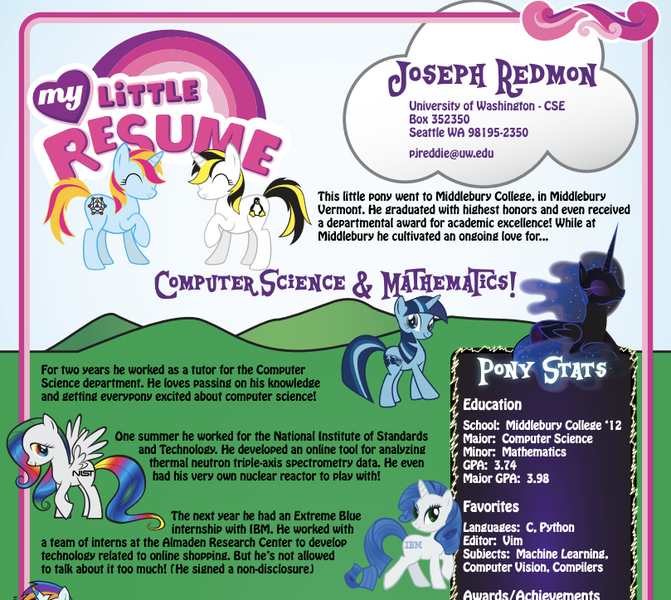  
[Joseph Redmon의 이력서]  
https://pjreddie.com/static/Redmon%20Resume.pdf  

광고 전단지같이 생긴 위 그림은... 바로 Joseph Redmon의 이력서(CV)입니다. 장난같겠지만... 네, 실화입니다.😆

> Be famous.😎

### YOLO v1, big wave의 시작
---
YOLO의 출현은 당시 전 세계 computer vision 학계와 업계에 충격적일 정도의 기술 진보를 보여주었습니다. 우선 "You Only Look Once: Unified, Real-Time Object Detection"라는 제목의 영상을 먼저 소개하겠습니다. 영상은 2분 15초부터 보시면 됩니다!

https://youtu.be/NM6lrxy0bxs  

CVPR 2016..!

무려 2016년도에 CVPR oral session에서 실시간 데모를 해버립니다. 지금은 자연스러워 보일 수도 있지만, 당시 기술 수준을 생각해보면 이것은 충격과 공포 그 자체 였습니다.  

> "아니 detection이 실시간으로 돌아간다고?? 초대형 서버도 아니고 학회장에서??"

'스타트업' 이라는 드라마에서 이 장면이 떠오르네요. YOLO vs. Faster R-CNN? 😆  
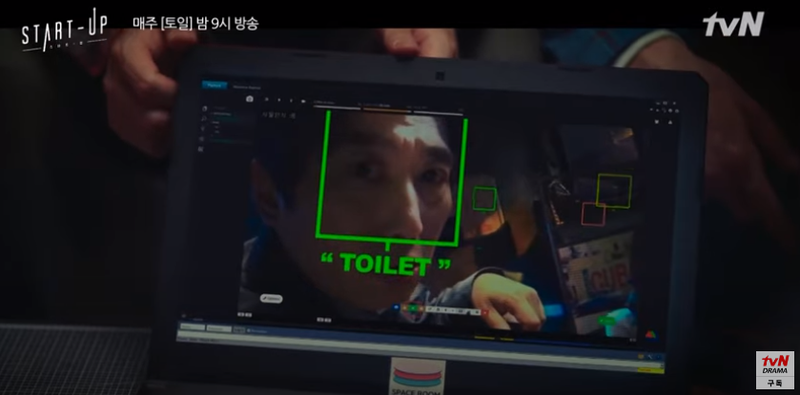  
https://www.youtube.com/watch?v=6kpgXfjIuy0  

실제로 YOLO를 실행했을 때의 결과는 아래의 그림과 같습니다. 사람을 비행기로 인식한 것 외에는 꽤 잘 detection하는 것 같죠?  

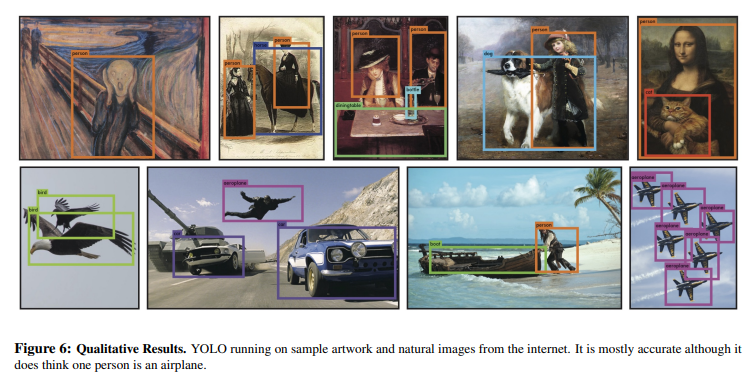  
https://arxiv.org/pdf/1506.02640.pdf


Q. 영상에서 2-Stage Detector의 대표 모델인 Faster R-CNN의 경우 mAP는 73.2, 속도는 7FPS(이미지 1장 당 140ms)로 소개되어 있는데요,
1-Stage Detector의 대표 모델인 YOLO의 경우에는 어느 정도의 성능을 보여준다고 하나요?  
63.4, 45FPS  
YOLO v1의 경우 mAP 69.0, 속도는 45FPS(이미지 1장 당 22ms)로 소개되어 있습니다.
Faster R-CNN과 비교했을 때, 속도는 확실히 개선되었지만 mAP는 아주 쵸큼 딸리는군요 ㅎㅎ

"You Only Look Once: Unified, Real-Time Object Detection"는 CVF 채널에서 유튜브 조회 수 1위 동영상입니다. 참고로 2위는 2 stage detector 기반인 Mask-R-NN이에요. Detection이 사람들이 얼마나 관심이 많은지 알 수 있는 대목입니다.

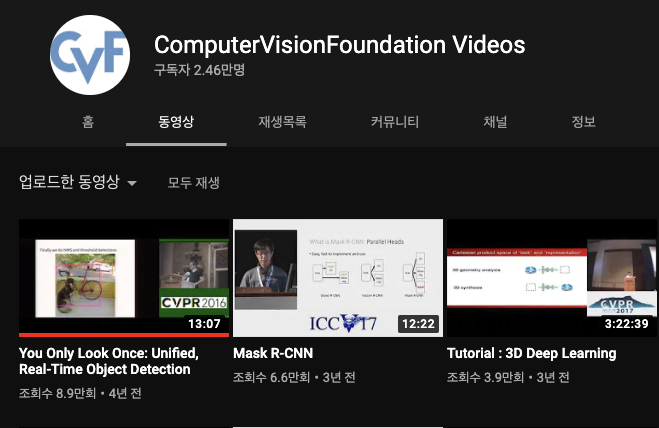  
https://www.youtube.com/channel/UC0n76gicaarsN_Y9YShWwhw/videos?view=0&sort=p&flow=grid


# 13-5. YOLO (2) YOLO v1의 원리

이제부터 YOLO v1의 원리에 대해 알아보죠. YOLO를 설명한 논문은 You Only Look Once:Unified, Real-Time Object Detection입니다. https://arxiv.org/pdf/1506.02640 이전 스텝에서 영상을 보았지만 논문을 통해 YOLO v1의 자세한 원리를 알아보는 것도 좋을 것입니다.

### YOLO 의 특징
---
YOLO의 특징은 'You Only Look Once: Unified, Real-Time Object Detection'라는 논문 제목에 잘 드러나 있습니다.

1. You Only Look Once  
전체 이미지를 보는 횟수가 1회라는 것을 의미합니다. YOLO는 클래스에 대한 정보와 주변 정보까지 한번에 학습하고 처리합니다. 따라서 배경 오류가 적고 일반화 성능이 좋습니다.  

2. Unified  
Localization과 Classification을 동시에 수행합니다. YOLO는 이미지를 신경망에 넣어주기만 하면 바로 detection이 가능합니다.  

3. Real-Time  
기본적인 YOLO 모델로는 45FPS(초당 프레임수), 빠른 버전은 150FPS까지 성능을 보입니다. (참고로 Fast R-CNN은 0.5FPS, DPM은 30FPS의 성능을 가지고 있습니다.) 따라서 스트리밍 비디오에서도 실시간으로 객체를 detection할 수 있습니다.

그 외에도 Object detection을 회귀 문제로 관점을 전환했고, 여러 도메인에서 object detection이 가능하다는 특징이 있습니다.

### RCNN과 YOLO
---
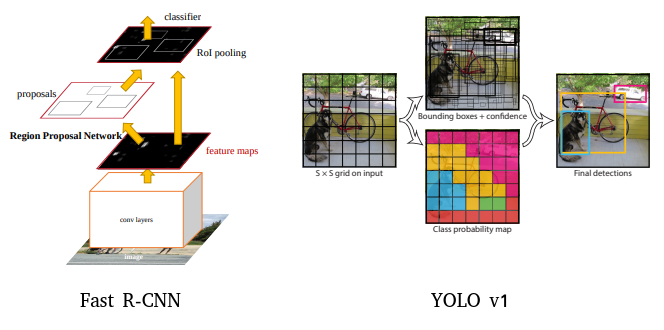  
https://arxiv.org/pdf/1506.01497v3.pdf, https://arxiv.org/pdf/1506.02640.pdf  

대표적인 2-stage detector인 RCNN과 1-stage detector인 YOLO 모델은 아래와 같이 기본 가정이 차이 납니다.

- RCNN 계열의 가정 :
    "객체가 존재할 것 같은 곳을 backbone network로 표현할 수 있다." → Region Proposal Network(RPN)
- YOLO v1의 가정 :
    "이미지 내의 작은 영역을 나누면 그곳에 객체가 있을 수 있다." → grid 내에 객체가 존재한다.
  
따라서 YOLO v1에서 grid는 고정되고, 각 grid 안에 객체가 있을 확률이 중요하게 됩니다.

### Q. YOLO v1에서 입력 이미지 크기가 448x448이고 출력 feature map이 7x7일 경우, 한 개의 출력 grid box(1x1 크기)가 의미하는 사이즈는 얼마일까요?
448 / 7 = 64이므로 grid box 사이즈는 64x64이다.

### YOLO의 grid cell
---
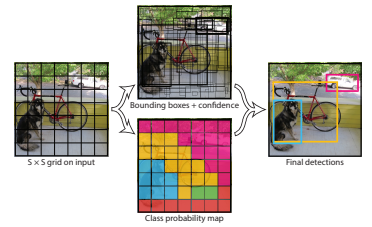  

YOLO는 이미지를 S x S grid로 나누고, box regression 단계와 각 클래스마다 probability map을 구하는 단계가 동시에 병렬적으로 수행됩니다.

논문에서는 입력 이미지를 7 x 7 grid로 나누고, 각 grid cell마다 예측하는 bound box(bbox)를 2개, 총 클래스의 수는 20으로 정하였습니다.

각 grid cell은 bounding box(bbox)와 C개의 class 확률을 예측합니다.

각 bounding box(bbox, B)는 x, y, w, h, confidence score를 예측합니다. x, y는 bbox의 중심 좌표이고 w와 h는 너비와 높이입니다. 주의할 점은 w와 h는 입력 이미지를 bbox의 너비와 높이를 나눠서 normalize한 값으로, 0과 1 사이의 값을 가진다는 것입니다.

confidence score는 box가 객체를 포함하고 있는지를 모델이 얼마나 자신 있는지, 그리고 박스가 예측하는 것이 얼마나 정확한지를 보여줍니다. 이를 식으로 나타내면 아래와 같습니다.  
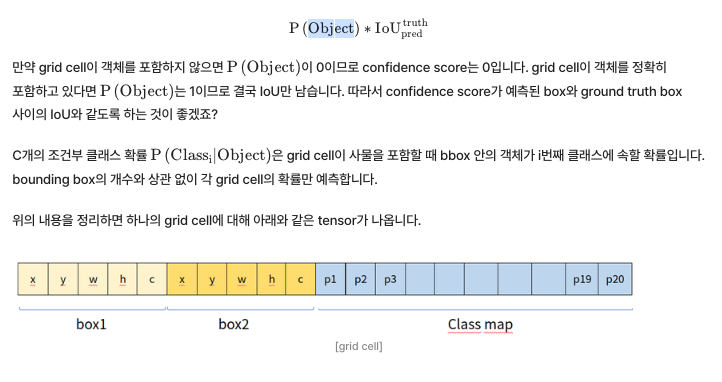  


#### Q. 1개의 7x7 grid 당 2개의 bounidng box(BBox) 와 20개 클래스를 예측하는 YOLO 를 만들고 싶은 경우, output tensor의 크기와 이를 flatten했을 때의 크기는 무엇인가요?
(7, 7, 30), 1470  
output tensor의 크기는 7 x 7 x (5 x 2 + 20)이며, 이를 flatten하면 1470이다.

위의 이미지에서 보면 자전거를 포함하는 grid가 많습니다. 이런 경우는 해당 grid의 bbox가 모두 자전거라고 예측할까요? 학습이 잘된 경우는 해당 grid들이 모두 비슷한 크기로 자전거의 bbox를 잡습니다. 여기서 동일한 객체를 잡는 bbox가 많아진다는 문제가 생깁니다.

이때는 NMS(Non-Maximum Suppression) 와 같은 기법을 이용합니다. 비-최대 억제라고도 불리는 NMS 기법은 object detector가 예측한 여러 개의 bounding box 중 정확한 bounding box만을 선택하는 기법입니다.

NMS의 알고리즘은 아래와 같습니다.

하나의 클래스에 대한 높은 confidence score 순서대로 bbox를 정렬합니다. confidence score가 특정 threshold를 넘지 않는 것은 제거합니다.
가장 높은 Confidence Score의 bbox와 겹치는 다른 bbox를 비교하여 IoU가 threshold보다 높으면 겹치는 bbox를 목록에서 제거합니다. 두 bbox의 IoU가 높다는 것은 같은 객체를 detect하고 있다는 의미이기 때문입니다.
1과 2의 과정을 반복해 마지막으로 남은 bbox를 반환합니다.
각 클래스에 대해 위의 과정을 반복합니다.
NMS 알고리즘을 적용하면 아래와 그림과 같이 겹쳐 있는 bounding box 중 정확한 bounding box만 표시됩니다.

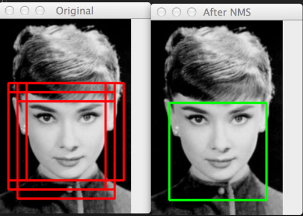  
[NMS를 적용했을 때의 bounding box]
https://www.pyimagesearch.com/2014/11/17/non-maximum-suppression-object-detection-python/  

YOLO의 목표는 grid에 포함되는 객체를 잘 잡아내는 것입니다. 즉 grid cell에 속하는 객체를 검출할 책임이 있는 거죠. 따라서 1개 grid에 귀속된 bbox 정보 (x, y, w, h)의 학습 목표는 bbox의 ground truth와 최대한 동일하도록 학습되는 것입니다. 학습 목표가 제대로 이루어졌는지를 확인하려면 객체 인식 모델의 성능 평가 도구인 IoU(Intersection over Union)를 사용하면 되겠죠?

- IoU, Intersection over Union 개념을 이해하자 https://ballentain.tistory.com/12

### YOLO의 네트워크 구조
---
YOLO의 네트워크 구조는 아래 그림과 같이 24개의 Conv 레이어와 2개의 Fully connected 레이어로 이루어져 있습니다.  
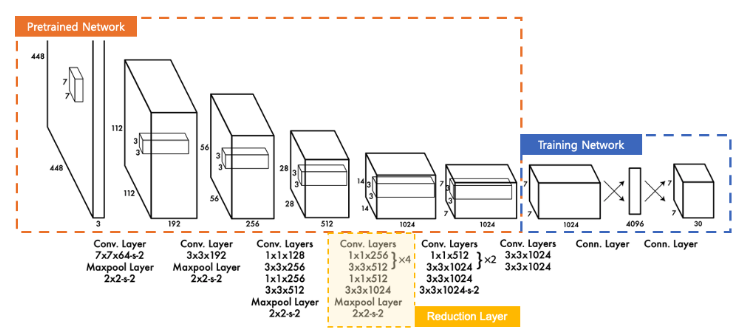  
[YOLO Architecture]  
https://medium.com/curg/you-only-look-once-%EB%8B%A4-%EB%8B%A8%EC%A7%80-%ED%95%9C-%EB%B2%88%EB%A7%8C-%EB%B3%B4%EC%95%98%EC%9D%84-%EB%BF%90%EC%9D%B4%EB%9D%BC%EA%B5%AC-bddc8e6238e2  

모델 구조의 앞부분(Pretrained)은 ImageNet의 1000개 클래스 데이터셋을 가지고 사전학습한 GoogLeNet 모델입니다. 사전학습을 위해 20개의 Conv 레이어와 average pooling 레이어와 fully-connected 레이어를 사용하였습니다. 그러나 GoogLeNet의 Inception 모듈 대신 1x1 reduction 레이어를 사용하여 연산량을 감소시켰습니다.

detection을 위해 사전학습된 모델에 4개의 Conv 레이어와 2개의 FC 레이어를 추가하였고, PASCAL VOC 데이터셋으로 fine-tuning하였습니다. fine-grained 이미지를 얻기 위해 원래의 224 x 224 이미지의 2배인 448 x 448의 이미지를 사용했다고 합니다.

마지막 레이어는 Class 확률와 bbox 좌표를 학습하고 예측하여 S x S x (B * 5 + C) 크기의 텐서로 예측값이 출력됩니다.

### YOLO의 Inference 과정
---
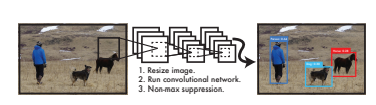  
[The YOLO Detection System]  
https://arxiv.org/pdf/1506.02640.pdf  

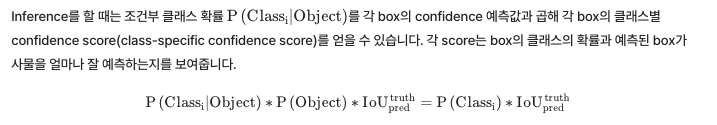

이 과정을 모든 bbox에서 시행하면 한 이미지에서 예측한 클래스별 confidence score의 개수는 7 * 7 * 2 = 98개입니다. 이 98개의 클래스별 confidence score에 대해 20개의 class를 기준으로 NMS를 하여 object에 대한 class와 bounding box location을 결정할 수 있습니다.

# 3-6. YOLO (3) YOLO v1의 성능

### YOLO v1 의 loss 함수
---
YOLO의 loss는 bbox의 위치 예측과 관련된 localization loss와 클래스 예측과 관련된 classification loss가 있으며, 두 loss 모두 SSE(sum-squared error)를 기반으로 합니다. 그런데 SSE는 이 두 loss를 동일하게 가중치를 줍니다. 이런 상황은 이상적이 아니겠죠? 뿐만 아니라 이미지 내 대부분의 grid cell에 객체가 없을 경우가 일반적인데, 이런 경우에는 confidence score가 0에 가깝게 됩니다. 이는 모델의 불균형을 초래합니다.

이런 문제를 해결하기 위해 bbox의 좌표에 대한 loss를 증가시키고, 객체가 없는 box의 confidence 예측값의 loss는 감소시켰습니다. 이를 위해 
λ_coord 와 λ_noobj 라는 두 개의 하이퍼파라미터를 사용했습니다.

뿐만 아니라 SSE는 큰 bbox와 작은 bbox의 loss를 모두 동일한 가중치로 계산합니다. 그러나 작은 bbox가 큰 bbox보다 조그마한 위치 변화에도 더 민감하죠. 이를 개선하기 위해 bbox의 너비와 높이에 square root를 취해주었습니다.

YOLO의 loss 함수는 아래와 같습니다.  

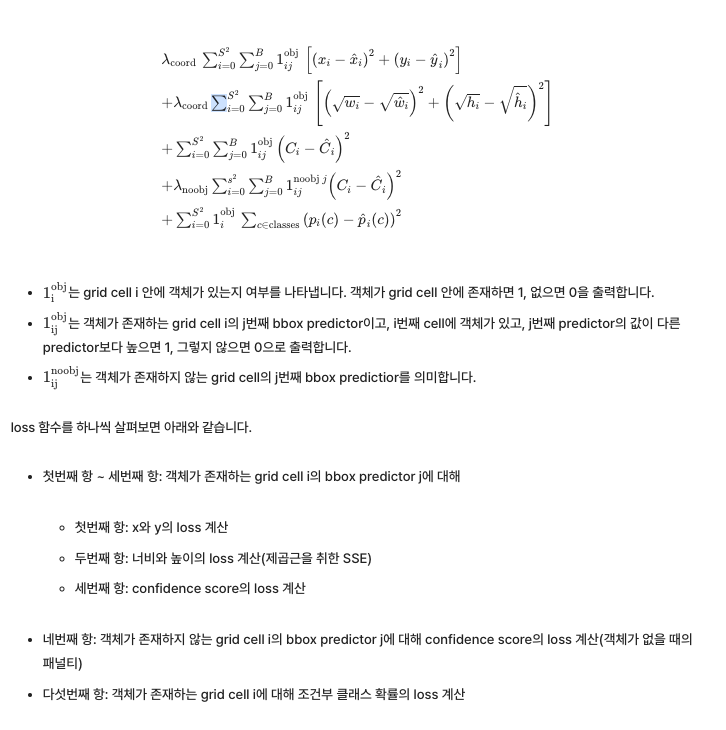

#### Q. YOLO v1의 loss function은 어떻게 구성되어 있나요?
	1.	Localization Loss: Bounding Box의 위치와 크기 오류
	2.	Confidence Loss: 객체 존재 확률 오류
	3.	Classification Loss: 객체 클래스 예측 오류
	4.	가중치 조정: Localization에는 더 높은 가중치 λcoord, No-object에는 낮은 가중치 λnoobj

### YOLO의 성능
---
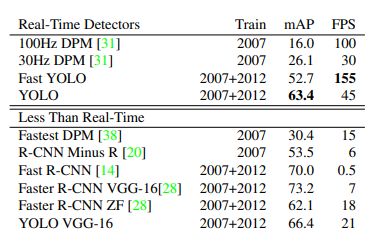  
[Real-Time Systems on PASCAL VOC 2007]  
https://arxiv.org/pdf/1506.02640.pdf  

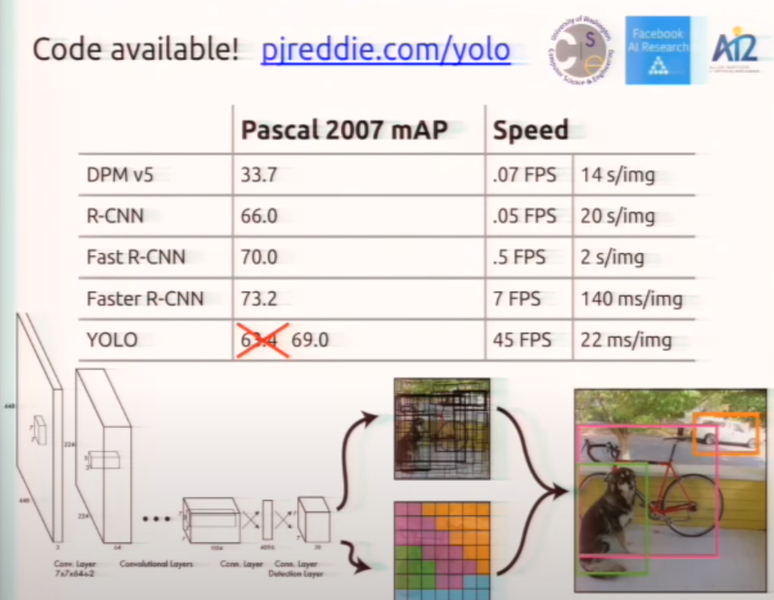  
https://www.youtube.com/watch?v=NM6lrxy0bxs&t=142s  

arXiv 논문 발표에서는 mAP가 63.4였지만 CVPR 2016 발표때는 69.0으로 모델의 성능을 향상되어 발표되었습니다. 즉 YOLO v1은 Faster R-CNN과 성능에 큰 차이가 나지 않으면서 속도는 6배 이상인 혁신적인 연구였습니다.  

### YOLO v1 의 단점
---
획기적이었던 YOLO v1에도 단점은 있었습니다. 우선 각각 grid cell이 2개의 box와 하나의 클래스만 예측 가능하므로 가까이에 있는 여러 개의 객체를 예측하기 어려웠습니다. 특히 새떼와 같이 그룹으로 나타나는 작은 object에 대해 예측을 제대로 하지 못했습니다.

또한 bbox의 형태가 training data를 통해 학습되었기 때문에 bbox 분산이 너무 넓어 새로운 형태의 bbox 예측이 잘 안되기도 했죠. 모델 구조상 backbone만 거친 feature map을 대상으로 bbox 정보를 예측하기 때문에 localization이 다소 부정확했습니다.

마지막으로 loss 함수가 작은 bbox와 큰 bbox의 loss를 같게 다루기 때문에 큰 box의 작은 loss보다 작은 box의 작은 loss가 IoU에 더 큰 영향을 미쳤습니다. 그래서 2017년 YOLO v2이 나오게 됩니다.

# 13-7. YOLO (4) YOLO v2

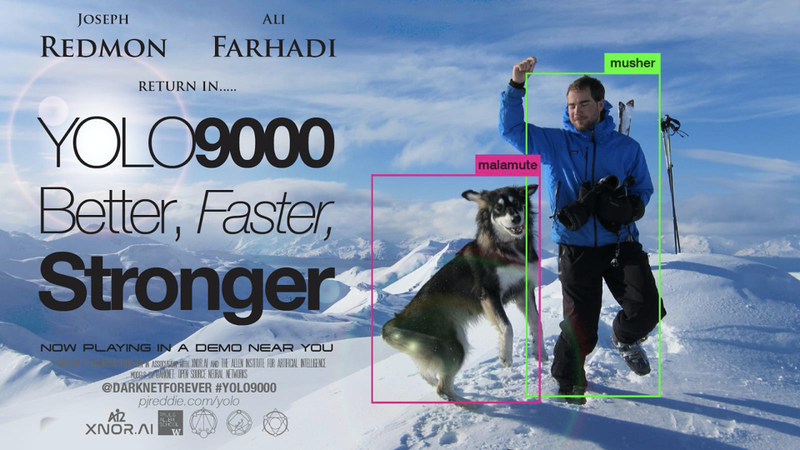

Object Detection에 혁신을 가져온 Redmon은 1년 뒤인 CVPR 2017에 YOLO를 v2로 발전시켜 가지고 나옵니다. 위의 이미지는 실제 발표 자료에 포함된 것이었습니다. 세상 힙함은 역시 빠질 수 없죠? 😜

Joseph Redmon의 발표자료에서 intro에서 YOLO 자체로 좋긴 좋았는데 정확도가 아쉬웠다고 언급합니다.

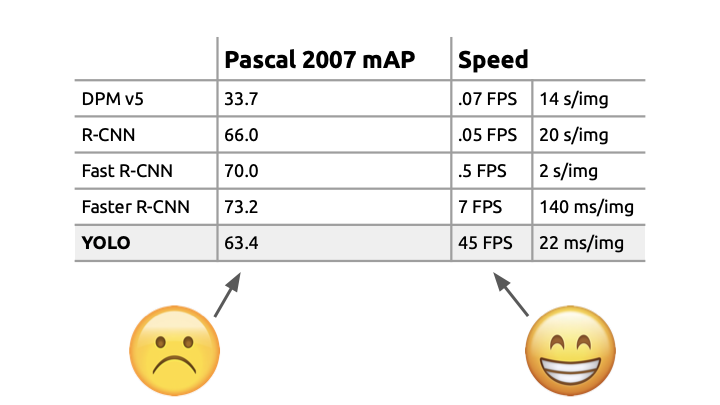  

CVPR 2016에서의 데모 중에 Redmon이 잠깐 사라진 적이 있는데, YOLO가 뒷문을 화장실로 인식해버리는 사고였어요. Redmon은 CVPR 2017에서 이때 장면을 캡쳐해서 가지고 나왔습니다. 즉 YOLO의 정확도가 낮다는 것을 보여주는 한 예였죠. 이전 스텝에서 언급한 드라마 '스타트업'에서도 사람의 얼굴을 화장실로 인식했던 것 기억하시죠?

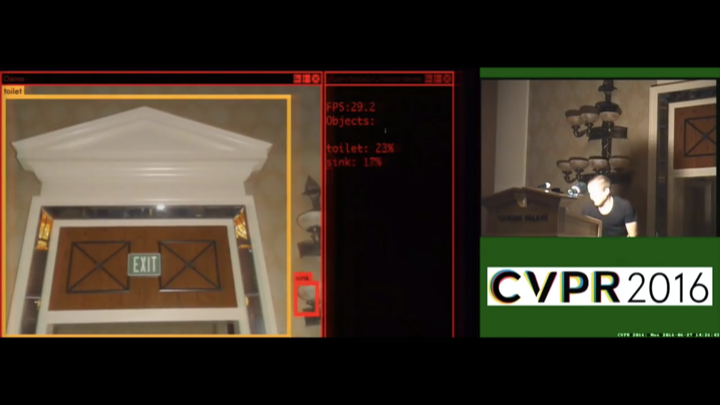  

### YOLO v2 의 목적
---
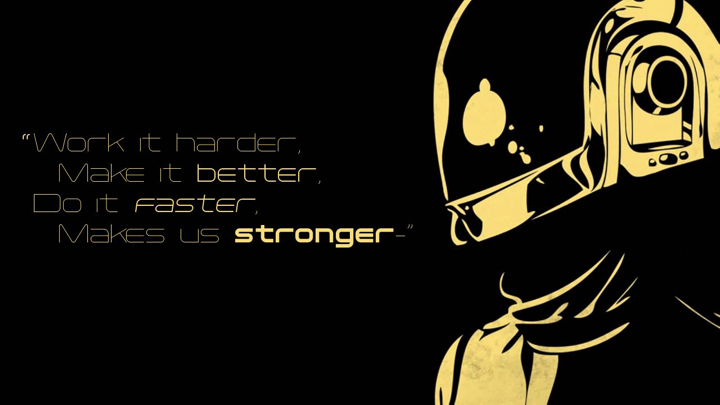  

YOLO의 목적은 아래와 같습니다.

- Make it better
- Do it faster
- Makes us stronger  

간단히 요약하자면 recall을 올리고 localization을 잘 해보자! 입니다.

#### Make it better
---
Better는 정확도를 올리기 위한 방법입니다. YOLO v2에서는 이전 모델에서 낮은 성능으로 보였던 localization과 recall을 높이면서도 여전히 모델을 단순하게 만들고 속도도 빠르게 하려고 하였습니다.

이를 위해 Batch Normalization, High Resolution Classifier, Convolutional with Anchor boxes, Dimension Clusters, Direct location prediction, Fine-Grained Features, Multi-Scale Training 등의 방법을 사용하였습니다. 각 방법을 사용했을 때의 결과는 아래의 표로 정리되어 있습니다.

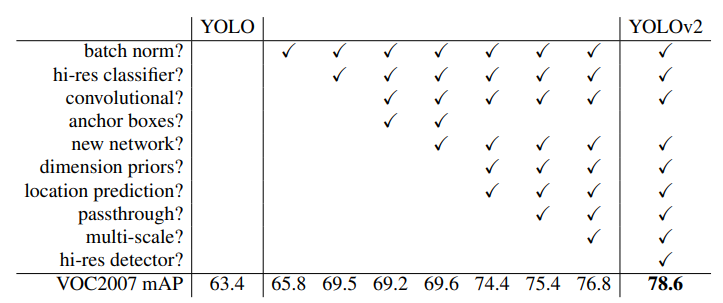

정확도를 높이기 위해 사용했던 각각의 방법을 간단히 정리하면 아래와 같습니다.

Batch Normalization  

모든 conv 레이어에 batch normalizaion을 사용하였고, dropout은 제거하였습니다. 이로써 mAP에서 2% 이상의 성능 개선을 하였습니다.

High Resolution Classifier

YOLO v1에서 ImageNet의 224 x 224 이미지를 학습하고, detection에서 448 x 448 이미지를 사용했던 것과 달리 YOLO v2에서는 처음부터 448 x 448의 해상도로 학습하였습니다. 이로써 mAP에서 4% 정도의 성능 개선을 이루었습니다.

Convolutional With Anchor Boxes

bounding box를 예측하기 위해 YOLO v1의 Fully connected 레이어를 제거한 후 Fully Convolutional Network를 사용하였고, anchor box들을 사용해 bounding box를 예측하였습니다.

또한 1개의 중앙점을 갖는 13 x 13(홀수 x 홀수)의 출력 feature map을 만들도록 입력 이미지의 크기를 448 x 448에서 416 x 416로 줄였습니다. 이는 대부분의 객체가 이미지의 중앙에 있는데, 중앙에 위치한 객체의 경우는 중앙점이 하나일 경우에 더 잘 예측할 것이라는 예상 때문이었습니다.

따라서 YOLO v2는 13 * 13 * 5개의 bounding box를 예측합니다.

그 결과 mAP는 69.5에서 69.2로 떨어지지만 recall은 81%에서 88%로 증가였습니다.

Dimension Cluster

Fast R-CNN에서는 anchor box의 크기와 비율을 사전에 정해주고, 학습을 통해 세부 조정을 했습니다. 그러나.YOLO v2는 k-means clustering을 적용해 최적의 anchor box를 결정하였습니다.

하지만 유클리드 거리를 사용하는 일반적인 k-means clustering과 달리 IoU 개념을 distance metric으로 사용해 더 좋은 anchor box를 얻을 수 있었어요. 그 이유는 ground truth box와 유사한, 즉 IoU가 높은 anchor box를 찾기 위해서였습니다.

클러스터링 개수를 늘리면 정확도가 높아지지만 속도가 느려지므로 YOLO v2는 최종적으로 5개의 anchor box를 사용했습니다.

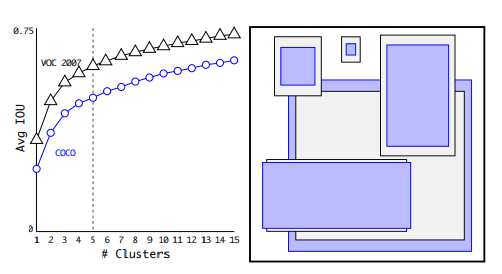  
[Clustering box dimensions on VOC and COCO]  
https://openaccess.thecvf.com/content_cvpr_2017/papers/Redmon_YOLO9000_Better_Faster_CVPR_2017_paper.pdf  

Direct location prediction

YOLO v2는 결정한 anchor box에 따라서 하나의 셀에서 5차원의 벡터로 이루어진 bounding box를 아래와 같은 방식으로 조정하여 예측하였습니다. 학습 초반에 random initialization으로 인한 학습의 불안정을 예방하기 위해 bounding box가 grid cell을 벗어나지 않도록 제약을 둔거죠. 주의할 점은 YOLO v1이 grid cell의 중앙점을 예측하였다면 YOLO v2은 좌상단으로부터 얼마나 이동하였는지 예측한다는 것입니다.  
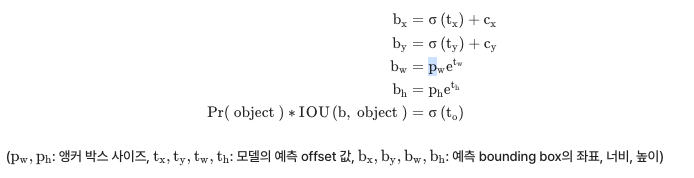  
Dimension Cluster와 Direct location prediction를 사용해 약 5%의 성능 향상을 얻었습니다.  

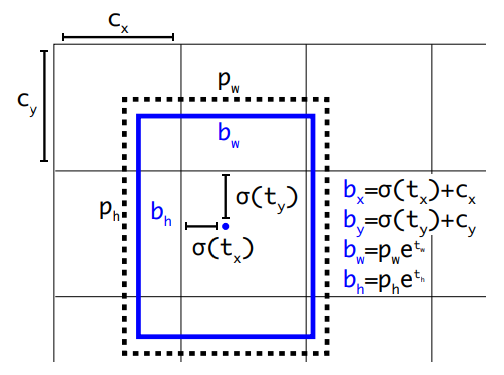  
[Bounding boxes with dimension priors and location prediction.]  
https://openaccess.thecvf.com/content_cvpr_2017/papers/Redmon_YOLO9000_Better_Faster_CVPR_2017_paper.pdf  

Fine-Grained Features

13 × 13의 feature map은 작은 물체 검출을 잘 하지 못한다는 단점이 있었기 때문에 YOLO v2는 passingthrough 레이어라는 것을 사용했습니다. passingthrough 레이어는 이전 레이어의 26 × 26 feature map과 13 × 13의 feature map을 concatenate합니다. 이렇게 하는 이유는 26 x 26의 feature map에 Fine-Grained Features(고해상도 피처)가 담겨 있기 때문입니다.

그러나 두 feature map의 크기가 다르기 때문에 26 × 26 × 512 feature map을 13 × 13 × 2048 feature map으로 변환한 후 concatenate하였습니다.

이로써 약 1%의 성능 향상을 보였습니다.

Multi-Scale Training

모델이 다양한 입력 사이즈에도 예측을 잘 할 수 있도록 매 10개의 batch마다 입력 이미지의 크기를 바꿔가면서 모델 학습을 하였습니다. 모델이 32 간격으로 downsample 되므로 입력 이미지는 32의 배수가 될 수 있습니다. 그래서 입력 이미지의 크기는 {320, 352, ... 608} 중 하나가 사용됩니다.

#### Do it faster
---
faster는 detection 속도를 향상시키기 위한 방법이었습니다.

Darknet-19

YOLO v2에서는 Fully Connected 레이어를 제거하고 global average pooling을 하여 가중치 파라미터 수를 크게 줄였습니다. 이렇게 해서 만든 최종 모델은 Darknet-19이라고 불리는데, 19개의 convolutional 레이어와 5개의 maxpooling 레이어로 이루어져 있습니다.

DarkNet-19를 통과한 YOLO v2의 최종 출력은 13 x 13 x 125이에요. 위에서 feature map이 13 x 13이라고 하였고, 5개의 bounding box를 예측하기 때문에 5 * (5 + 20)이므로 13 x 13 x 125이 됩니다. 이전 스텝에서 하나의 bounding box가 x, y, w, h, confidence를 예측하고, 클래스의 개수가 20개라고 했던 것 기억하시죠?  

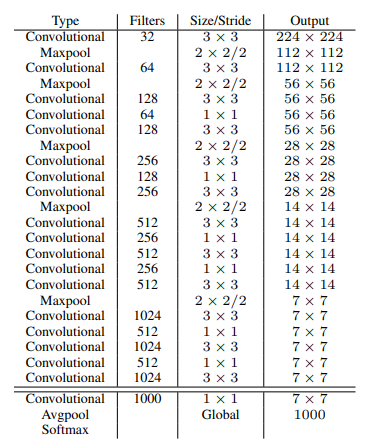  
[Darknet-19]  
https://openaccess.thecvf.com/content_cvpr_2017/papers/Redmon_YOLO9000_Better_Faster_CVPR_2017_paper.pdf  

#### Makes us stronger  
---
stronger는 더 많은 범위의 class를 예측하기 위한 방법이었습니다. YOLO v1는 PASCAL VOC 데이터셋에서 제공되는 20개의 클래스를 기준으로 학습해서 20개의 클래스만 detection하였습니다. 그러나 YOLO v2에서는 9천개의 클래스에서 detection할 수 있도록 하고, 그 모델을 YOLO9000이라고 불렀습니다. 그래서인지 YOLO v2는 YOLO9000: Better, Faster, Stronger https://openaccess.thecvf.com/content_cvpr_2017/papers/Redmon_YOLO9000_Better_Faster_CVPR_2017_paper.pdf 이라는 논문 이름으로 발표되었죠.

YOLO 9000은 YOLO v2와 모델 구조가 같고 detection하는 라벨을 늘렸기 때문에 자세히 설명하지는 않겠습니다. 간단히 설명하자면 9천개의 클래스에 대해 분류를 하기 위해 계층적으로 분류 작업(Hierachical Classification)을 수행하여 기존의 WordNet 기반의 데이터를 트리 구조인 WordTree를 생성하였습니다.

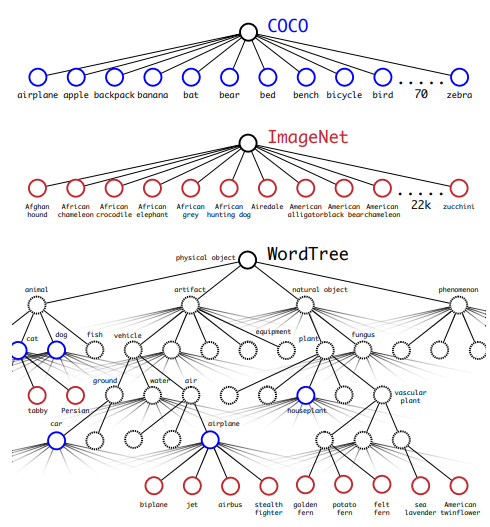  
[WordTree]  
https://openaccess.thecvf.com/content_cvpr_2017/papers/Redmon_YOLO9000_Better_Faster_CVPR_2017_paper.pdf  

ImageNet + COCO 데이터셋 + ImageNet Detection을 합쳐 9천개의 클래스 라벨을 생성했습니다. 그 후 Detection과 Classification을 합쳐서 학습을 하는데, Detection 데이터셋과 Classification 데이터셋의 개수가 차이가 크기 때문에 oversampling하여 Detection과 Classification 비율을 4:1로 맞췄습니다. Detection 데이터셋은 classification과 bbox에 대한 loss를 역전파하였지만 Classification 데이터셋은 classfication loss만 역전파하여 학습하였습니다. 이로 인해 9천개의 클래스를 detection할 수 있었죠. 이에 대한 자세한 내용은 논문을 통해 알아보시기 바랍니다.

#### Q. YOLO v1과 비교했을 때, YOLO v2에서 달라진 점은 무엇이 있었나요?
1.	Backbone: Darknet-19 도입
2.	Anchor Boxes: 다중 박스 예측
3.	Batch Normalization: 학습 안정화
4.	Multi-Scale Training: 다양한 이미지 해상도 학습
5.	Passthrough Layer: 작은 객체 탐지 개선
6.	다중 데이터셋 학습: 더 많은 클래스 학습  
    
속도개선을 위해 기존의 Darknet에서 Darknet-19로 모델 변경,
성능향상을 위해 모든 Conv layer에 Batch Normalization 사용 / bbox 예측을 위해 Fully Convolutional Network 사용 및 여러 개의 anchor box를 사용 / bbox가 grid cell을 벗어나지 않도록 제약을 두는 direct location prediction 등의 기법 활용,

그 외에 기존에 20개의 클래스만을 detection 할 수 있었던 YOLO v1이었지만, v2로 넘어오면서 9천 개의 클래스를 detection 할 수 있게 되었죠!

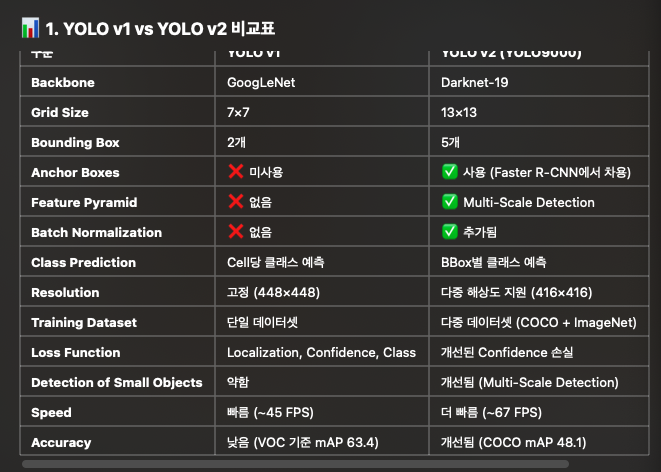

### YOLO v2 의 성능비교
---
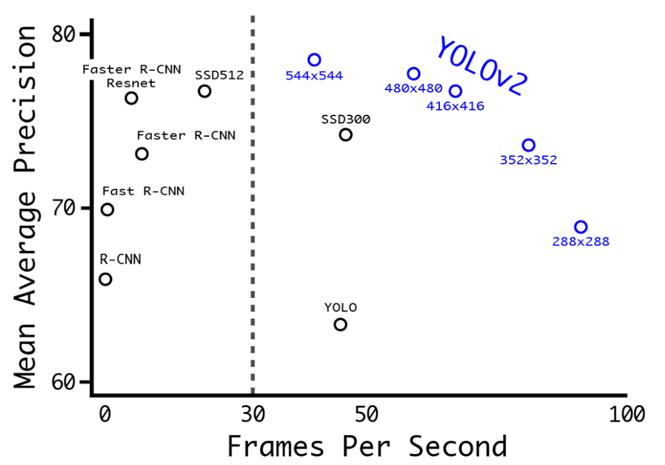  
[YOLO v2 성능]  
https://medium.com/@akarshzingade/logo-detection-using-yolov2-8cda5a68740e  

YOLO v2의 성능은 위의 그래프에서도 볼 수 있듯이 mAP가 상승하고 FPS도 개선되었다는 것을 알 수 있습니다. 그러나 여전히 mAP와 FPS간의 trade-off가 존재하였죠.

YOLO v2 발표 당시 SSD, R-FCN 등이 이미 발표된 상황이었습니다. 특히 SSD와 YOLO는 같은 single stage 방법을 지향하고 있었기 때문에 경쟁 모델이 되었고, YOLO v2 입장에서는 SSD와의 성능 차이를 부각시키는게 중요한 과제였습니다.

아래는 TED의 YOLO v2의 데모영상입니다.  

https://youtu.be/Cgxsv1riJhI?si=JZlNGnXxTjk5MNF3

# 13-8. YOLO (5) YOLO v3

### RetinaNet의 도발
---
아래의 RetinaNet figure를 보시면 YOLO v2를 언급하면서 보통 figure에는 그려주지도 않는 신선함을 보여줍니다. "YOLO 이제 퇴물아니야?"라는 느낌을 풍기면서 말이죠. 😝

> 실제로 retinanet 성능이 YOLO v2보다 좋기도 했습니다.  

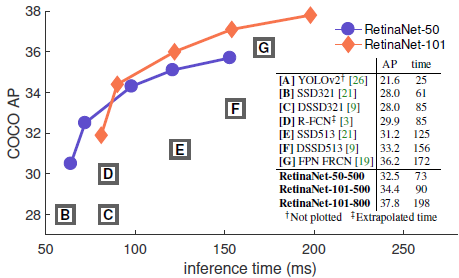
https://arxiv.org/pdf/1708.02002.pdf  

하지만 역시 CV의 힙스터 Redmon은 새로운 YOLO를 들고 RetinaNet과 정면 비교하였습니다.  

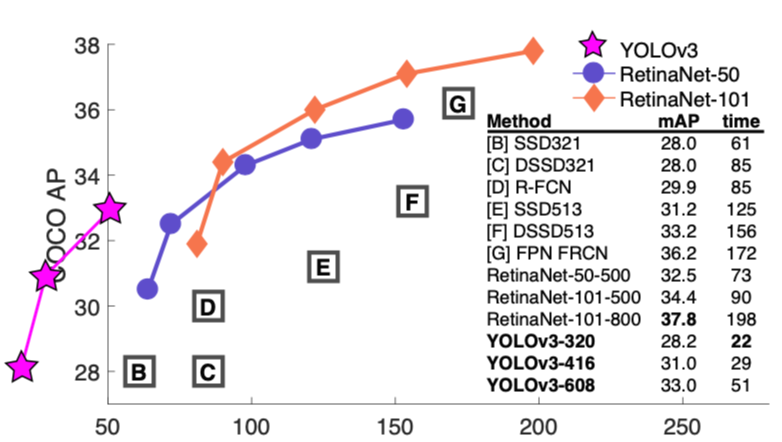
https://arxiv.org/pdf/1804.02767.pdf  

RetinaNet figure를 그대로 가지고 와서 YOLO v3 성능을 박아 넣었죠.

> "graph 그릴 곳이 없어?? graph 바깥에 그리면 되잖아??"

해당 figure는 YOLO 프로젝트 페이지에도 그대로 사용됩니다.  

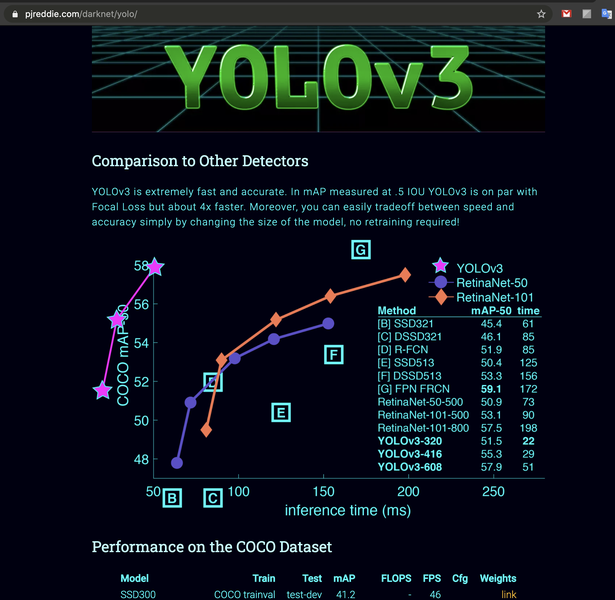

### YOLO v3 원리
---
YOLO v3는 YOLO v2보다는 속도는 조금 느리지만 정확도를 개선한 모델입니다. 특히 YOLO의 약점이었던 작은 물체를 detection할 때 성능을 개선하였죠.

YOLO v3는 YOLOv3: An Incremental Improvement라는 이름의 논문에 소개되었습니다. 그러나 엄밀히 말하면 논문이라기보다 Tech Report인데, 이전의 YOLO 모델과의 차이점을 간략하게 소개한 보고서입니다.

사실 YOLO v3는 YOLO v2에서 약간의 변화만 추가한 모델입니다. 따라서 YOLO v3의 원리는 YOLO v2와의 차이점을 중심으로 설명하겠습니다.

Bounding Box Prediction

Bounding Box Prediction은 YOLO v2와는 거의 차이가 없습니다. 그러나 각각의 bounding box마다 objectness score, 즉 bounding box에 물체가 있는지를 예측하는 점수를 logistic regression을 사용해 예측하였습니다. anchor box와 ground truth box의 IoU가 가장 높은 박스의 objectness score는 1로 두고 나머지는 무시하였습니다. 또한 Faster R-CNN 등의 다른 모델과 달리 각각의 ground truth에 대해 1개의 bounding box만 가지게 된다는 차이가 있었습니다.  

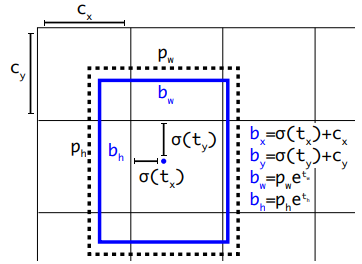
[Bounding box]  
https://arxiv.org/pdf/1804.02767.pdf  

Class prediction

YOLO v3는 하나의 이미지에 다양한 label을 붙일 수 있는 multilabel classification를 하였습니다. 예를 들어 여성의 이미지에 person과 woman이라는 두 가지의 label을 붙일 수 있는 것을 의미합니다. 이를 위해 여러 개 중 하나만 찾는 softmax classifier가 아닌 해당 label이 맞는지 아닌지를 판단하는 logistic classifier를 사용하였고, binary cross entropy를 사용해 loss를 계산하였습니다.

Predictions Across Scales

YOLO v3은 3개의 scale로 bouding box를 예측하였고, 각 scale당 3개의 bouding box를 예측하였습니다. 따라서 총 9개의 bouding box가 나오게 되며, 텐서는 N × N × [3 ∗ (4 + 1 + 80)]입니다. 여기서 3은 anchor box의 수이고, 4는 bounding box의 좌표, 너비, 높이이며, 1은 objectness score, 그리고 80의 클래스의 수입니다.

또한 feature map을 2배씩 upsampling함(13, 26, 52)으로써 더 의미 있는 semantic information을 얻고, 이전 feature map과 concatenate하여 보다 fine-grained한 정보를 얻을 수 있었다고 합니다.

DarkNet-53

성능을 높이기 위해 YOLO v3은 53개의 레이어를 사용하였습니다. YOLO v2의 아키텍처였던 DarkNet-19에 residual network를 넣어 레이어를 53개까지 쌓을 수 있었습니다.  

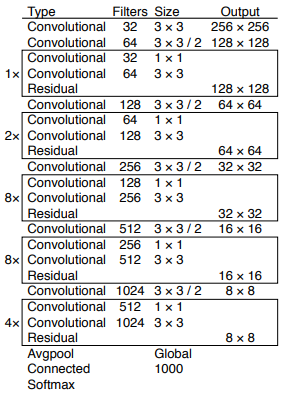
[DarkNet-53]  
https://arxiv.org/pdf/1804.02767.pdf  

DarkNet-53은 DarkNet-19보다 정확도가 높았고, ResNet-101이나 ResNet152과 성능이 비슷하지만 연산면에서 효율적이었습니다.  

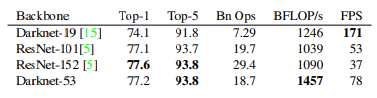
[성능과 연산량 비교]  
https://arxiv.org/pdf/1804.02767.pdf  

전체 모델 구조는 아래의 이미지로 나타낼 수 있습니다. 입력 이미지를 DarkNet-53에 통과시켜서 downsampling하면서 feature map을 추출합니다. 이 feature map을 토대로 detection을 하고, upsampling 후 다시 detection하고 다시 upsampling을 한 후에 detection하게 됩니다. 즉 3개의 scale된 bounding box를 이용한 detection을 함으로써 여러 개의 label에 대해서도 classification을 할 수 있었습니다.  

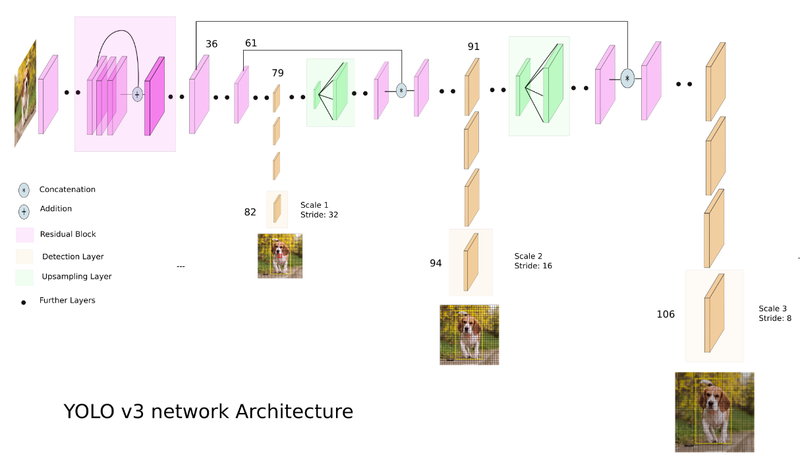
[YOLO v3의 구조]  
https://towardsdatascience.com/yolo-v3-object-detection-53fb7d3bfe6b  

#### Q. YOLO v2와 비교하여 YOLO v3의 모델 부분에서는 어떠한 점이 달라졌나요? 
1.	Backbone Upgrade: Darknet-53로 더 깊고 강력한 특징 추출
2.	Multi-Scale Detection: 13×13, 26×26, 52×52로 다양한 객체 크기 감지
3.	Anchor Boxes: 스케일당 3개의 Anchor Box로 총 9개
4.	Class Prediction: Softmax → Sigmoid (Multi-label 지원)
5.	Loss Function 개선: Binary Cross-Entropy 도입
6.	Activation Function 개선: Leaky ReLU + Sigmoid
7.	Residual Connections: Gradient Vanishing 문제 완화  

YOLO v3에서는 DarkNet-53을 사용하여 기존의 아키텍처였던 DarkNet-19에 residual network를 추가해 layer를 53개까지 쌓을 수 있었습니다. 이를 통해 정확도를 높였고, 기존 ResNet 컨셉과 비슷한 성능을 보이지만 연산면에서 효율적인 모습을 보여주었습니다.

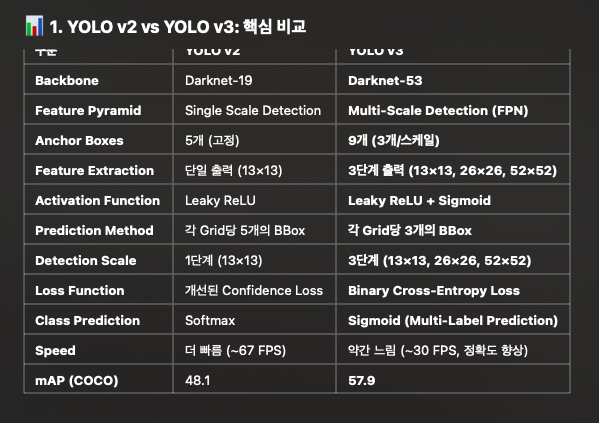

# 13-9. 이야깃거리 : YOLO v3 그 이후

Redmon은 Computer Vision 연구가 자신의 목적과는 다르게 군사적으로 사용되고 있는 것에 큰 회의감을 느끼고 CV 연구를 그만두겠다고 선언합니다. YOLO 등 DarkNet 프로젝트는 Alexey Bochkovskiy가 메인테이너로 이어 받게되죠.  

### YOLO family
---
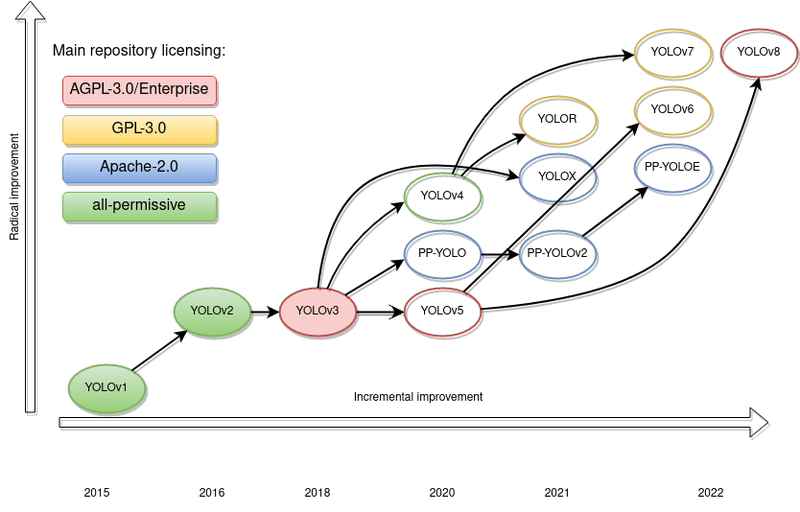
[YOLO FAMILY]  
https://www.linkedin.com/pulse/evolution-yolo-neural-network-family-from-v1-v8-part-1-max-ivanov/  

이후에도 다양한 연구자들에 의해 YOLO를 개량한 모델이 등장했습니다. YOLOv5(2020.06) 는 처음으로 DarkNet을 벗어나 PyTorch로 구현되어 논문 없이 선행 발표되었으며, 바이두에서는 자체 오픈 소스 딥러닝 전용 프레임워크를 사용하여 PP-YOLO(2020.08)를 발표하기도 했습니다.

### 변화무쌍함을 보여주는 YOLO의 변천사!
---
YOLO는 추론 속도가 빠르지만, 정확도가 높지 않다는 평을 가진 모델이었습니다. 이런 초기 평가에 맞추어, 연구자들은 속도와 정확도를 높히려는 방식으로 모델 개량에 접근하게 됩니다. 이는, 레이어 구조의 디자인을 변경하는 것을 뜻합니다.
YOLOv4(2020.04)는 큰 구조를 공유하되, 태스크에 따라 깊이나 너비가 다른 다양한 버전의 모델을 소개하였습니다, 이 전략은 후속 모델들에도 계속 차용되고 있습니다.

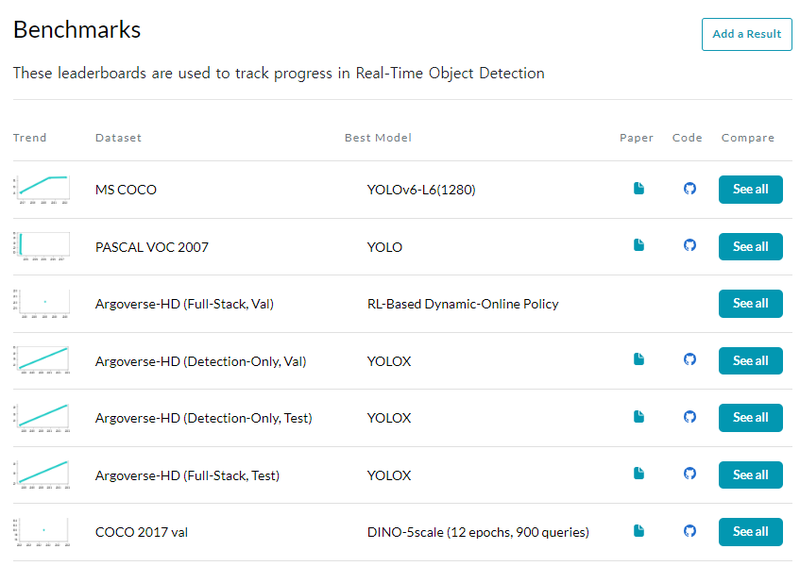
[다양한 Object detection 벤치마크에서의 YOLO의 성능]  
https://paperswithcode.com/task/real-time-object-detection  

YOLOX는 파격적으로 구조와 알고리즘을 변경하였습니다.
기존의 YOLOv2부터 v5까지 사용했던 Anchor를 구조에서 배제하고, YOLOv1부터 유지한, YOLO의 아이덴티티였다고 할 수 있었던 객체 유무 및 라벨 정보, bounding box regression이 결합된 inference를 분해하는 decoupled prediction head를 적용하여 계산량을 급격히 감소시켰습니다. 이 과정에서 accuracy의 감소를 방지하기 위해 객체 중심 주변의 cell을 함께 prediction하는 Multi positive 기법도 차용했습니다.  

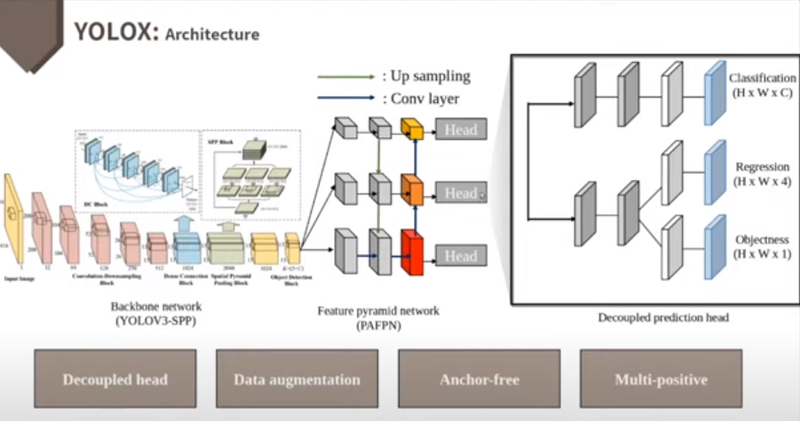
[YOLOX 아키텍처]  
https://www.youtube.com/watch?v=N2rLSzEqqI8  

YOLOX가 더 궁금하시다면 다음의 포스트를 참고하시기 바랍니다!

- 진보된 detection technique - YOLOX https://cobslab.tistory.com/13  

구조와 규모, 알고리즘 변경을 거치며, YOLO Family는 속도와 정확성 측면에서 지금까지도 MS COCO, Argoverse 등의 벤치마크에서 최고의 성능을 자랑하고 있습니다.  

### NLP 트렌드를 반영한 새로운 Yolo의 등장
---
한편으로, NLP 분야에서 큰 영향을 끼치고 있는 Transformer는 CV에서도 점차 영향력을 키우고 있었습니다.
흐름에 맞추어, Transformer Encoder와 NLP heads를 차용한 YOLOS를 시작으로, NLP 분야의 기법을 도입한 YOLO 모델들도 속속들이 소개되었습니다.  
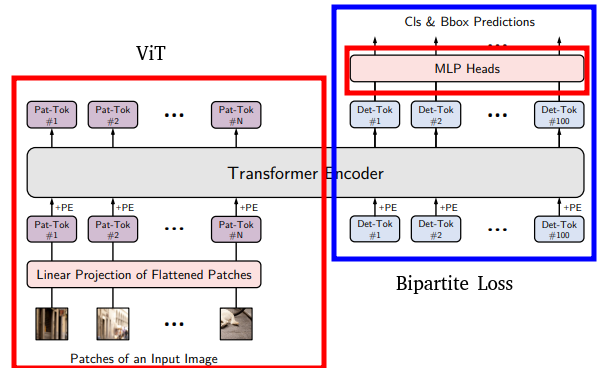
[YOLOS 아키텍처]  
https://arxiv.org/pdf/2106.00666.pdf  

Transformer head를 붙여 기존 모델을 개량하려는 시도도 있었죠.  

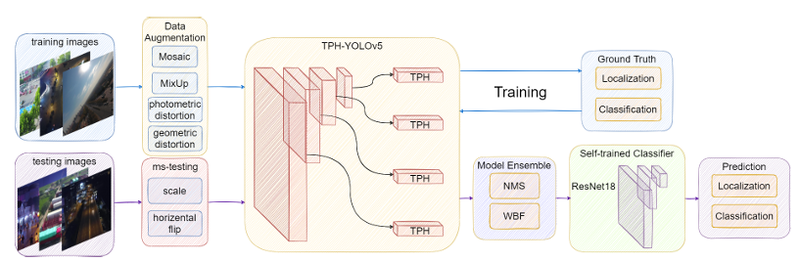
[Transformer Head를 YoloV5에 적용한 TPH-YOLOv5]   
https://arxiv.org/abs/2108.11539  

### 성능을 넘어, 트렌드에 맞는 모델로 변모하다
---
추론 속도와 정확성 측면의 성능 개선 외에도, YOLO의 사용성을 개선하려는 시도 또한 이루어졌습니다.

- YOLOv8 (2023.01) https://github.com/ultralytics/ultralytics  

“YOLOv8 is designed to be fast, accurate, and easy to use”

YOLOv5를 개발한 Ultralytics https://www.ultralytics.com/ko 에서, YOLOv8을 출시하면서 내세운 표어입니다.  
사용자 친화적으로 개발을 목표로 하여, Object detection 뿐만 아니라 Instance segmentation, human pose estimation 등을 같은 모델로 수행할 수 있습니다. 배포 코드 설치와 사용법 또한 간단함은 물론 공식 페이지에도 친절히 소개되어 있습니다. 물론, 성능적으로 SOTA를 이루었기도 하구요!

이런 간편함에 힘입어, Keras cv에서도 YOLOv8을 내장 모델로 지원하고 있습니다.  

Keras CV의 YOLOv8 튜토리얼 https://keras.io/examples/vision/yolov8/  

- YOLO-NAS (2023.05) https://github.com/Deci-AI/super-gradients/blob/master/YOLONAS.md  

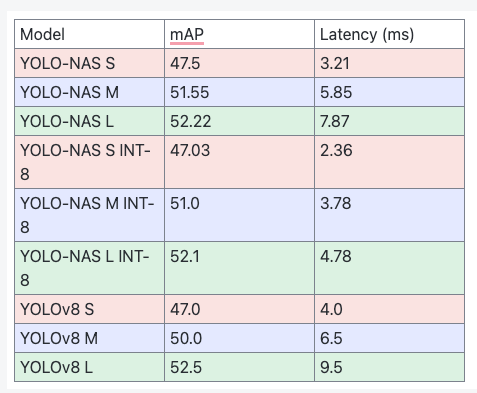
[YOLO-NAS 와 YOLOv8의 성능 비교표]  
https://www.augmentedstartups.com/blog/yolo-nas-vs-yolov8-a-comprehensive-comparison  

기존의 Yolo를 비롯한 여러 분야의 Sota 모델들은 연구자들이 직접 디자인한 구조를 차용하고 있었습니다. 이는 특정 task와 데이터셋에 최적화된 구조가 있다는 것과 같으며, 이를 탐색해 나아가는 것은 많은 시간과 비용을 소모하는 일입니다. 모델이 점점 깊어지는 방향으로 발전함에 따라, 위 비용 문제를 극복하고자 모델의 아키텍쳐를 자동으로 구성하는 신경 아키텍쳐 검색(NAS) 기법이 적용되는 시도가 생겨났습니다.

YOLO family의 YOLO-Nas라는 모델 또한 이를 적용했습니다! NAS로 최적의 아키텍쳐를 구성하며, YOLOv8보다 개선된 mAP을 보이면서도 빠른 속도로 추론을 해내었습니다. 양자화를 적용하면 갑절로 빠른 추론을 보여줍니다. 특히 작은 물체 감지에 우수한 성능을 보여준 이 모델은 edge-device application에 실시간으로 적용할 수 있습니다.  

- YOLO-world (2024.01) https://arxiv.org/abs/2401.17270  

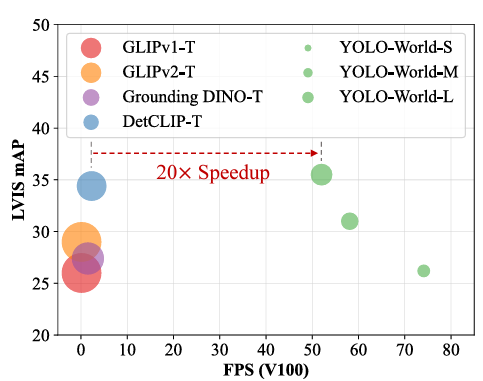
[YOLO-world와 기존 비전모델간의 성능 비교]  
https://arxiv.org/abs/2401.17270  

2021년, 대용량 데이터의 사용으로 모델 성능의 향상을 끌어내는 NLP 트렌드에 맞추어, 사전 정의된 클래스의 구분 대신 이미지의 캡션 정보를 그대로 라벨 정보로 사용, 대용량의 이미지를 학습한 비전-언어 모델인 Clip이 등장했습니다.

이 모델을 Backbone에 결합하여, 개방형 시나리오에서 사용할 수 있는 비전-언어모델인 YOLO-World가 소개되었습니다. 기존의 비전-언어 모델의 장점을 가져가면서, 엄청난 속도 향상을 이루어냈습니다. 연구자들은 웹UI로 데모를 제공하고 있습니다. Yolo-world의 강력함, 느껴보시죠!  

YOLO WORLD WEBUI DEMO https://www.yoloworld.cc/  

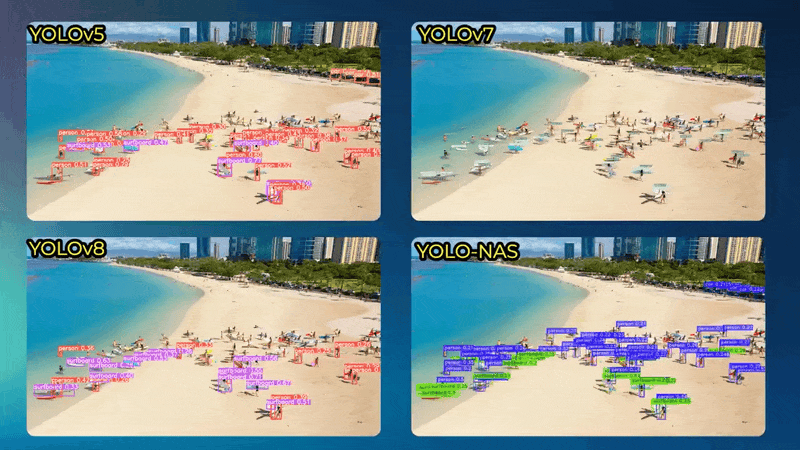
[다양한 YOLO FAMILY의 동작 비교]  
https://medium.com/augmented-startups/rise-of-yolo-nas-discover-the-8-features-that-propel-it-to-object-detection-stardom-461043eff11f  

YOLO는 자율주행로봇, 위성 관측 등 다양한 산업 분야에 도입되었으며, 많은 사랑을 받고 있습니다. YOLO의 연구는 계속 이어지고 있습니다!

# 13-10. SSD (1) SSD의 특징

### SSD : Single Shot MultiBox Detector
---
YOLO가 1 stage로 object detection을 할 수 있다는 증명을 한 뒤, 1 stage detector는 수많은 발전을 이루었습니다. SSD는 YOLO v1에서 grid를 사용해서 생기는 단점을 해결할 수 있는 아래와 같은 몇 가지 테크닉을 제안했죠.

- Pre-defined Anchor Box
- Image Pyramid  

이제부터 SSD에 대한 자세한 내용을 논문 SSD: Single Shot MultiBox Detector https://arxiv.org/pdf/1512.02325 을 참고로 하여 설명해 보겠습니다.

### SSD의 Workflow
---
YOLO v1의 두번째 단점은 box 정보 (x, y, w, h)를 예측하기 위한 seed 정보가 없기 때문에 넓은 bbox 분포를 모두 학습할 수 없었다는 점입니다. 이로 인한 성능 손실이 존재할 수 있었죠. 따라서 Faster R-CNN 등 에서 사용하는 anchor를 적용할 필요가 있었습니다.

만약 개가 등장하는 bounding box가 존재한다면, 그 bounding box만의 x, y, w, h 특성이 존재하기 때문에 pre-defined된 box의 x, y, w, h를 refinement하는 layer를 추가하는 것이 이득이었습니다. 이 anchor box를 SSD에서는 Default box라고 부릅니다

### Image Pyramid
---
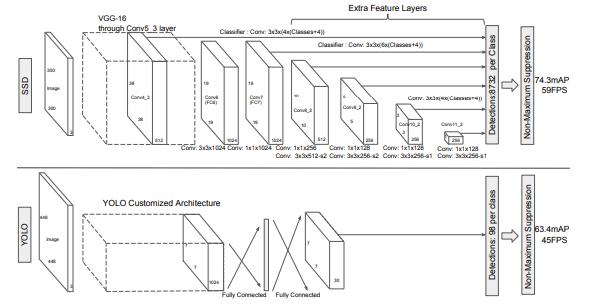
[SSD와 YOLO의 아키텍처 비교]  
https://arxiv.org/pdf/1512.02325.pdf  

Image Pyramid는 ImageNet으로 사전학습된 VGG16을 사용합니다. VGG에서 pooling layer를 거친 block은 하나의 image feature로 사용 가능합니다.

YOLO에서 7x7 크기의 feature map 하나만을 사용했다면, SSD는 38 x 38, 19 x 19, 10 x 10, 5 x 5, 3 x 3, 1 x 1인 다양한 크기의 feature map을 사용하였습니다. 각 feature map은 YOLO의 관점에서 보면 원본 이미지에서 grid 크기를 다르게 하는 효과가 있었습니다. 따라서 5 x 5 크기의 feature map에서 grid가 너무 커서 작은 물체를 못찾는 문제를 38 x 38 크기의 feature map에서 찾을 수 있는 단서를 마련하였습니다.

즉 SSD는 서로 다른 크기의 feature map에서 object detection을 해서 작은 물체는 큰 feature map에서, 큰 물체는 작은 feature map에서 찾을 수 있게 한 거죠. 각 단계에서 추출된 feature map은 detector와 classifier를 통과해 object detection을 합니다.

각 feature map에는 bounding box와 클래스 정보가 담겨 있는데, 이 feature map들을 2번 convolution합니다. 위의 그림에서 보면 Classifier: Conv: ...라고 쓰여있는 부분에서 1번 더 convolution을 하게 되죠. 3 x 3 x (default box의 수 x (class의 수 + 4)의 가중치로 convolution을 하여 n x n x (default box의 수 x (class의 수+4))의 feature map을 얻게 됩니다. 여기서 class는 PASCAL VOC의 클래스 20개와 배경 클래스를 합해 21이고, + 4는 bounding box의 위치 정보 x, y, w, h의 개수를 의미합니다.

아래의 그림은 위의 그림에서 생략되었던 detector와 classifier를 포함한 아키텍처를 보여줍니다. 각각의 feature map에서 뽑아낸 6개의 classifier의 예측을 NMS를 사용해 confidence가 가장 높은 box 하나만 남겨 최종 detection을 합니다.

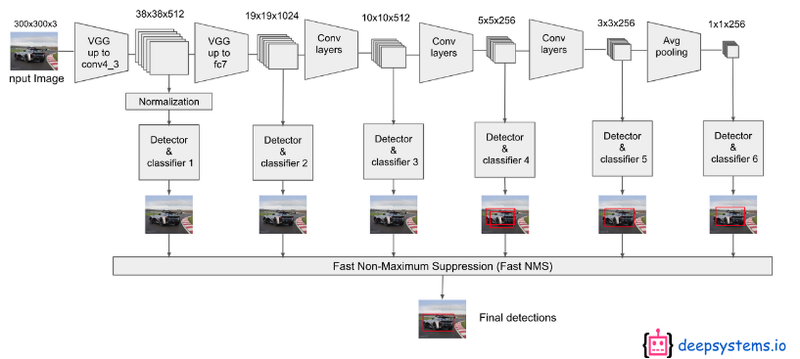
https://www.youtube.com/watch?v=P8e-G-Mhx4k


#### Q. Image feature pyramid의 단점은 무엇인가요?
YOLO와 비교하였을 때 최소 feature map의 개수만큼 계산량이 많다. 38 x 38 크기의 feature map은 box를 계산하기에는 충분히 깊지 않은 network일 수 있다.

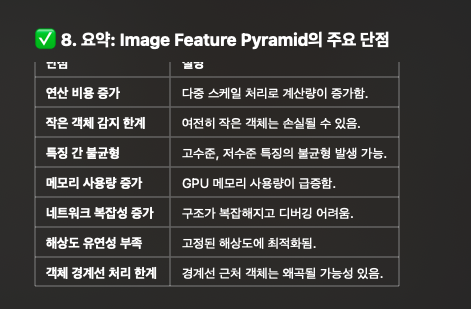

### SSD의 framework
---
SSD는 입력 이미지와 각 객체에 대한 ground truth box만을 필요로 합니다. convolution을 할 때 비율이 다른 default box를 설정하는데, 아래의 그림은 다른 크기의 feature map에서, 각 객체마다 다른 비율의 default box를 4개씩 만들어 놓은 것을 표현한 것입니다. 각 default box에서 default box와 대응되는 bounding box regression을 적용하여 box의 (x, y, w, h)를 찾고 confidence, 즉 box 안에 물체가 있는지 없는지를 예측하는 점수를 예측합니다.

학습할 때 이 default box와 ground truth box를 비교해 ground truth box와 비슷한 default box를 선택하여 positive, 나머지는 negative로 설정합니다. 고양이는 개보다 작기 때문에 8 x 8 feature map에서는 고양이를 잡아내고, 4 x 4 feature map에서는 개를 잡아낸 것을 볼 수 있습니다.

이렇게 각 레이어에서 피쳐 맵들을 가져와 Object Detection을 수행한 결과들을 모두 합하여 localization loss와 confidence loss를 구한 다음, 전체 네트워크를 학습시키는 방식으로 1 Step end-to-end Object Detection 모델을 구성하였습니다.  

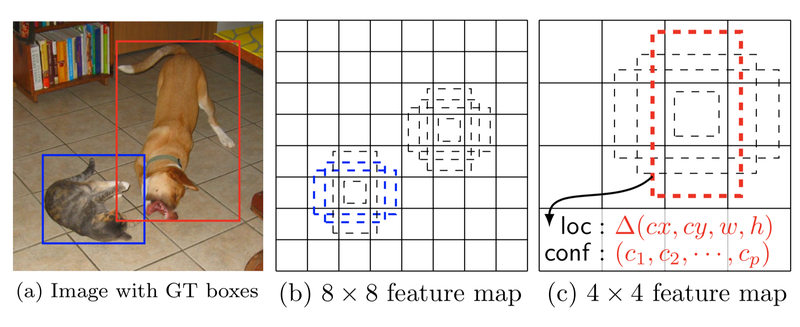
[SSD framework]  
https://arxiv.org/pdf/1512.02325.pdf  

### Default box를 위한 scale
---
다양한 크기의 Default box 생성을 위해 SSD는 아래와 같은 식을 사용합니다.  
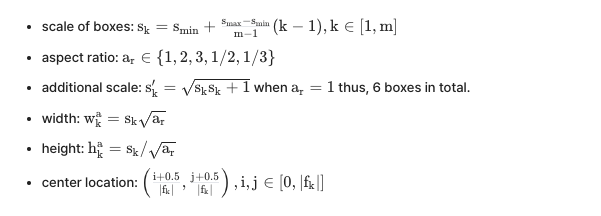  

여기서 aspect ratio를 {1, 2, 3, 1/2, 1/3}로 설정하여 default box의 너비와 높이를 구할 수 있습니다. 예를 들어 k=3이라면 scale은 0.48이며 aspect ration가 2라면 너비는 0.68, 높이는 0.34입니다. 논문에서는 1개의 box를 더 추가해 총 6개의 default box의 너비와 높이 값을 구합니다.

입력 이미지에서 default box가 위치할 중심점(center location)의 식에서 f_k 는 k번째 feature map의 크기입니다. 대략 예측되는 상자가 정사각형이나 가로로 조금 길쭉한 상자, 세로로 조금 길쭉한 상자이기 때문에 2:3으로 임의로 정해도 학습이 잘 되지만, 특이한 경우, 즉 가로 방향으로 걸어가는 지네와 같은 경우에 위의 비율로 정하면 threshold를 0.5로 했을 때 학습이 되지 않습니다. 따라서 학습할 이미지에 따라서 aspect ration를 조정해야 합니다. 임의로 정하는 것은 비효율적이므로 KNN과 같은 알고리즘을 활용하면 좋은 결과가 나올 것입니다.

이렇게 구해준 중심점 좌표들에 원래의 입력 이미지의 크기를 곱해 중심점을 구하고, 각 중심점마다 default box를 그릴 수 있습니다. 이를 시각화하면 아래와 같습니다.  

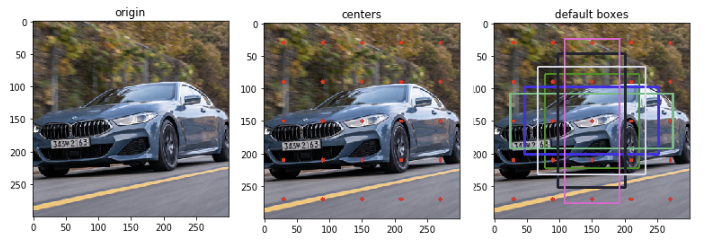
[default box 그리기]  
https://yeomko.tistory.com/20  


# 3-11. SSD (2) SSD의 Loss와 성능

### Matching strategy
---
학습 전에 ground truth와 defalt box의 jaccard overlap(IoU) https://en.wikipedia.org/wiki/Jaccard_index 이 0.5 이상인 것을 미리 매칭시켜 positive sample로 설정합니다. jaccard overlap이 0.5 이상인 default box를 모두 사용하면 학습 문제를 단순화시켜서 더 높은 성능을 가져올 수 있습니다.

### SSD Loss function
---
SSD Loss function의 식은 아래와 같습니다.  

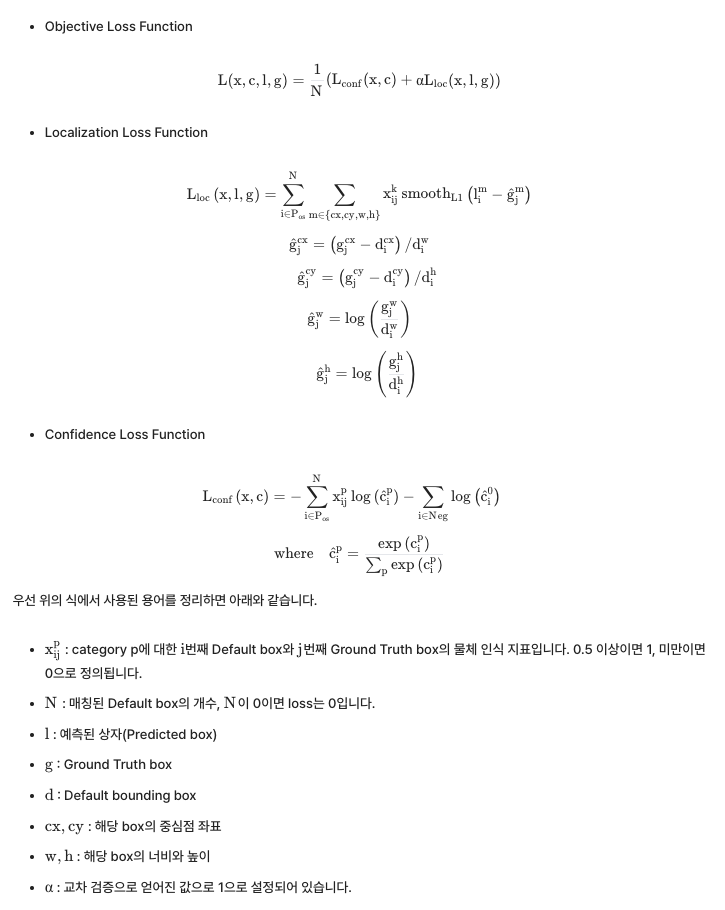
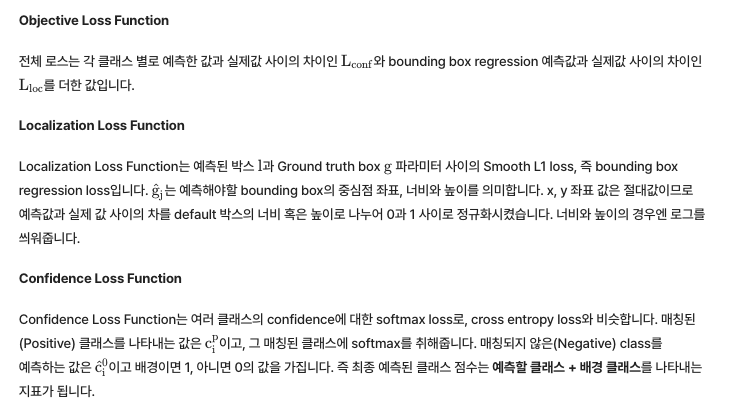


#### Q. SSD의 loss function에 대해 각자 이해한 내용을 정리해볼까요?
1.	Multi-task Loss: 객체 위치(Localization)와 클래스 분류(Classification)를 동시에 최적화
2.	Smooth L1 Loss: Localization Loss의 안정적 학습
3.	Cross-Entropy Loss: 클래스 분류의 정확한 예측
4.	Hard Negative Mining: Negative Sample의 균형 유지
5.	Normalization: Positive Anchor Box의 수로 정규화  

SSD에서 사용되는 loss function은 각각의 예측된 상자(수식에서 l)와 Ground Truth box(수식에서 g)의 IoU 값을 계산하고, 해당 값을 이용해 Localization Loss와 Confidence Loss를 계산합니다.
Localization Loss는 bounding box regression error를 나타내며, Confidence Loss는 객체의 존재 여부를 나타냅니다.

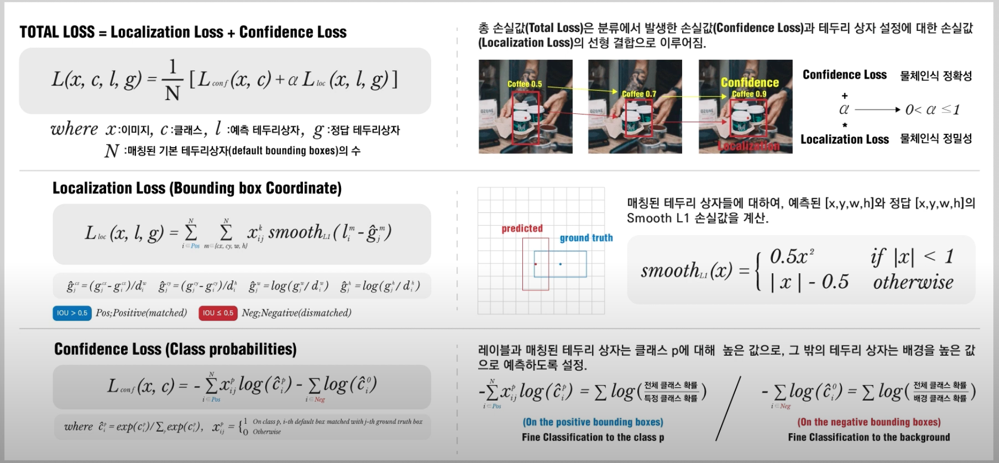

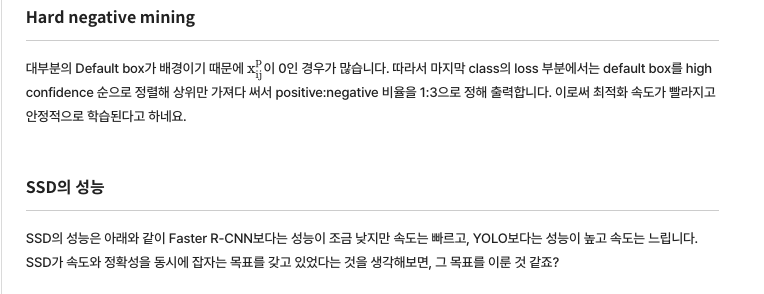
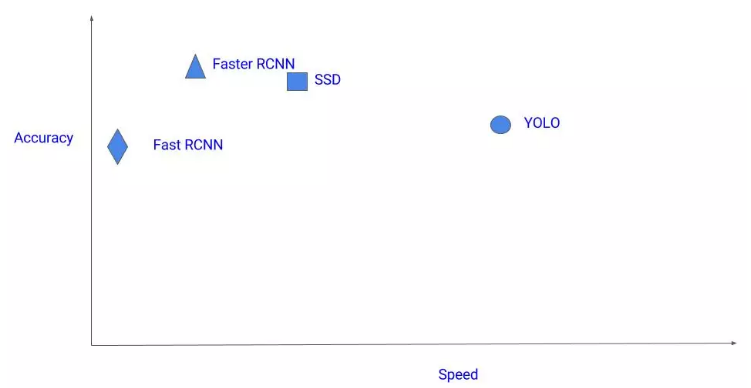
[SSD와 기타 object detection 모델의 정확도와 속도 비교]  
https://cv-tricks.com/object-detection/faster-r-cnn-yolo-ssd/  

YOLO가 작은 물체를 잘 찾아내지 못했던 것 역시 SSD에서는 어느 정도 해결한 것 같습니다. 심지어 YOLO v2보다 성능이 더 좋다는 것을 알 수 있습니다.

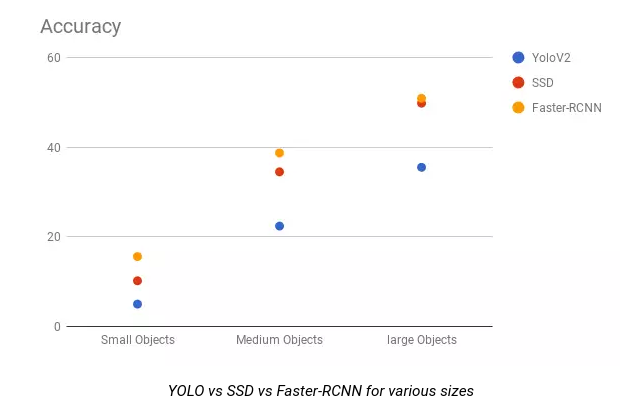  
https://cv-tricks.com/object-detection/faster-r-cnn-yolo-ssd/  

### FCOS
---
FCOS:Fully Convolutional One-Stage Object Detectionan는 기존의 anchor box기반에서 벗어나 pixelwise로 예측하는 FCOS를 제안했습니다. Anchor box를 사용하면서 생기는 부작용(예: 학습 계산량, 하이퍼파라미터에 민감한 성능 등)을 해결하면서도 좋은 성능을 보입니다.

자세한 내용은 아래의 자료를 참고하세요.

- Brief Review of Anchor-Free Object Detection https://blog.si-analytics.ai/72

# 13-12. 얼굴 인식을 위한 모델들

지금까지 One-Stage Detection의 가장 대표적인 두가지 모델인 YOLO와 SSD에 대해 살펴보았습니다. 다음 실습에서는 SSD를 활용한 Face Detection을 실제로 구현해 보는 과정을 통해 더욱 깊이있게 알아보게 될 것입니다.

SSD 이후로 한동안 Face Detection 모델이 지속적으로 발표되었습니다. papers with code에서 검색하면 Face Detection https://paperswithcode.com/task/face-detection에 대한 다양한 모델을 살펴볼 수 있습니다.

### TinaFace
---
논문 TinaFace: Strong but Simple Baseline for Face Detection https://arxiv.org/pdf/2011.13183v3 에서는 Face Detection과 Object Detection이 다르지 않다는 점을 지적하면서, Object Detection에서 사용했던 기법을 사용해 단순하지만 좋은 성능을 보이는 모델인 TinaFace를 소개합니다. TinaFace는 백본으로 ResNet50을 사용했고 기존에 존재했던 모듈(Feature Pyramid Network, Inception block, FCN 등)을 활용해 만들어졌습니다.
TinaFace는 WIDER Face hard 벤치마크에서 accuracy 93.5를 기록하였습니다. 이후에도, Poly-NL(2021.07), ASFD(2022.01) 등의 새로운 기법이 등장했지만, TinaFace의 기록은 현재까지 깨어지지 않고 있습니다.

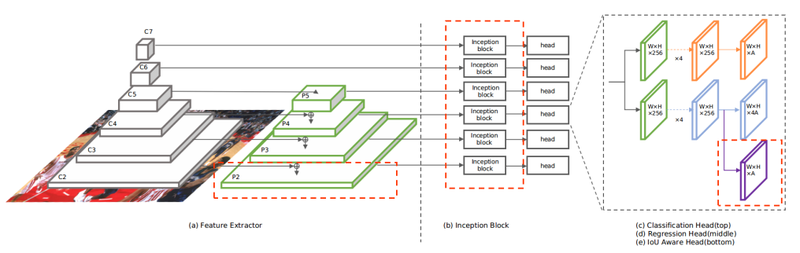
[TinaFace 모델 아키텍처]  
https://arxiv.org/pdf/2011.13183v3.pdf  

### DSFD
---
DSFD는 Feature Enhance Module(FEM), Progressive Anchor Loss(PAL), Improved Anchor Matching (IAM)라는 기법을 사용해 성능을 높인 모델인데요, 언급한 세 기법이 two-stream으로 디자인되어 있어서 Dual Shot Face Detector라는 이름이 붙었다고 합니다. 자세한 내용은 논문 DSFD: Dual Shot Face Detector https://arxiv.org/pdf/1810.10220 을 참고해 보세요.

### Face Detection VS Face Recognition
---
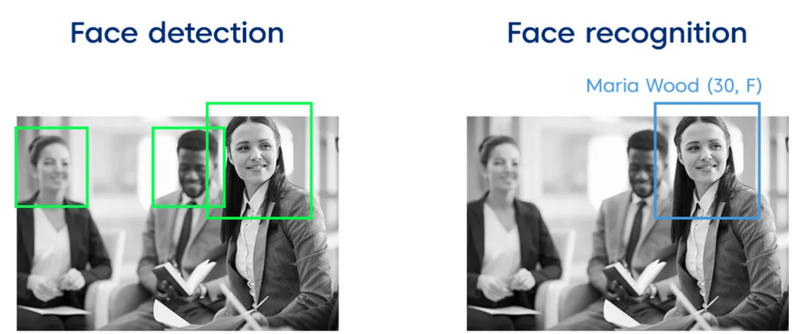
[Face detection vs Face recognition]  
https://medium.com/sciforce/face-detection-explained-state-of-the-art-methods-and-best-tools-f730fca16294  

한편, CV 도메인에서 사람의 얼굴을 연구하는 또 하나의 큰 줄기는 Face Recognition입니다.
Face Detection은 사람의 얼굴을 찾는 과정이라면, Face Recognition은 그 얼굴이 어떤 사람인지 파악하는 Task입니다. 보안 시스템에서 신원파악을 하는 용도 등 마찬가지로 널리 사용됩니다. 개개인을 식별하는 기술, 무척이나 어려울 것 같죠?

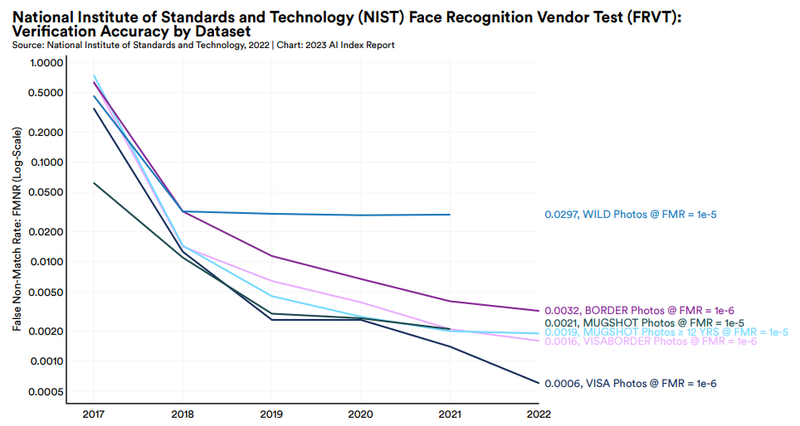
[HAI Index2023에 소개된 Face Recognition의 현주소]  
https://aiindex.stanford.edu/report/  

실제로는 Face Recognition 또한 금방 다양한 벤치마크에서 포화상태에 이르렀습니다.
2023년 스탠포드의 HAI index report에 의하면, 미국 국립표준기술연구소 (NIST)의 Face Recognition Vendor Test, FRVT가 다양한 벤치마크에서 오차율 (False None Match Rate, FNMR) 1% 이하를 보여주었습니다.
---
지금까지 보안부터 엔터테인먼트까지 다양한 곳에 널리쓰이는 CV의 객체 인식과 얼굴 인식 기술들을 살펴보았습니다. 지금까지 수고하셨습니다!

# 13-13. 마무리하며

이번 시간에는 Dlib 얼굴 인식에서 개선해 볼 포인트와 YOLO, SSD 등 Face Detection을 위한 딥러닝 모델들에 대해 알아보았습니다.

속도 개선을 위해 1-Stage Detector의 대표 모델인 YOLO와 SSD의 특징에 대해 공부했었고, 특히나 YOLO의 경우 v1 ~ v5 부터 시작해서 PPYOLO, YOLOR, YOLOX, YOLOS까지 발전 과정과 각각의 모델이 갖는 컨셉들에 대해 논문으로 접해보았습니다.

YOLO v1과 SSD의 loss function 수식들을 보면서 어떻게 구성되어 있는지, 각각의 notation과 수식이 갖는 의미는 무엇인지도 배웠죠.
수식을 이해하는 것이 쉽지는 않으셨을텐데, 잘 따라와주셨습니다!😎

더 빠르고, 좋은 성능을 보이는 얼굴 인식 어플리케이션을 제작할 수 있는 밑거름이 되는 유익한 시간이었기를 바라면서.. 마무리를 하는 차원에서 종합 퀴즈를 풀어볼까요?

### 종합 퀴즈
---
지금까지 여러분들이 얼마나 학습을 충실히 하셨는지 알아볼까 합니다. 여러분의 실력을 쑥쑥 향상시켜줄 수 있는 퀴즈이기도 하므로 배운 내용을 다시 생각하면서 아래의 퀴즈를 풀어보세요. 🤗

#### Q. 네트워크 구조와 바운딩 박스 예측에 대해서 YOLO v1과 SSD의 차이점을 설명해볼까요?

YOLO v1: 최종 Feature Map (7×7)을 통해 모든 객체를 예측, 각 Grid Cell이 최대 2개의 Bounding Box만 예측.  
SSD: 다양한 크기의 Feature Map (38×38, 19×19, 10×10 등)을 사용, 각 Feature Map의 Grid Cell이 다양한 Anchor Boxes (Predefined Boxes)를 사용하여 더 많은 Bounding Box를 예측.

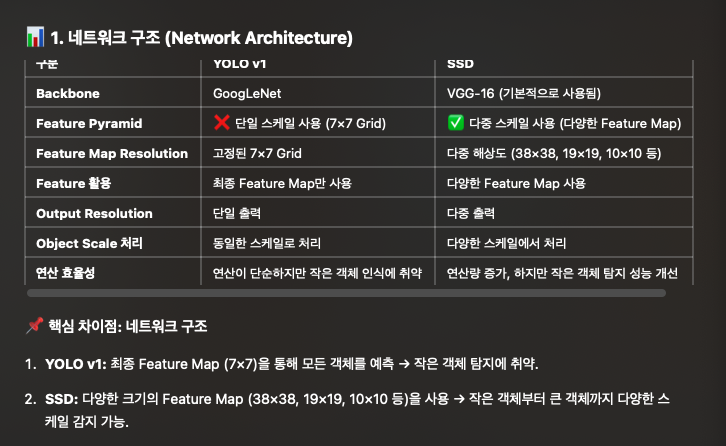
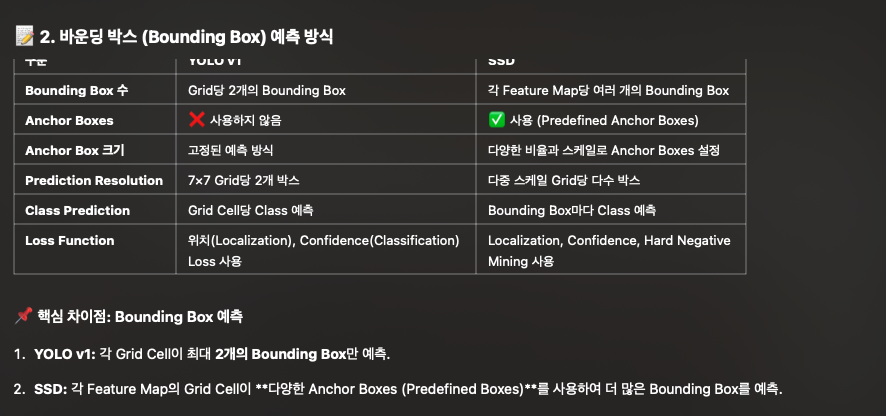
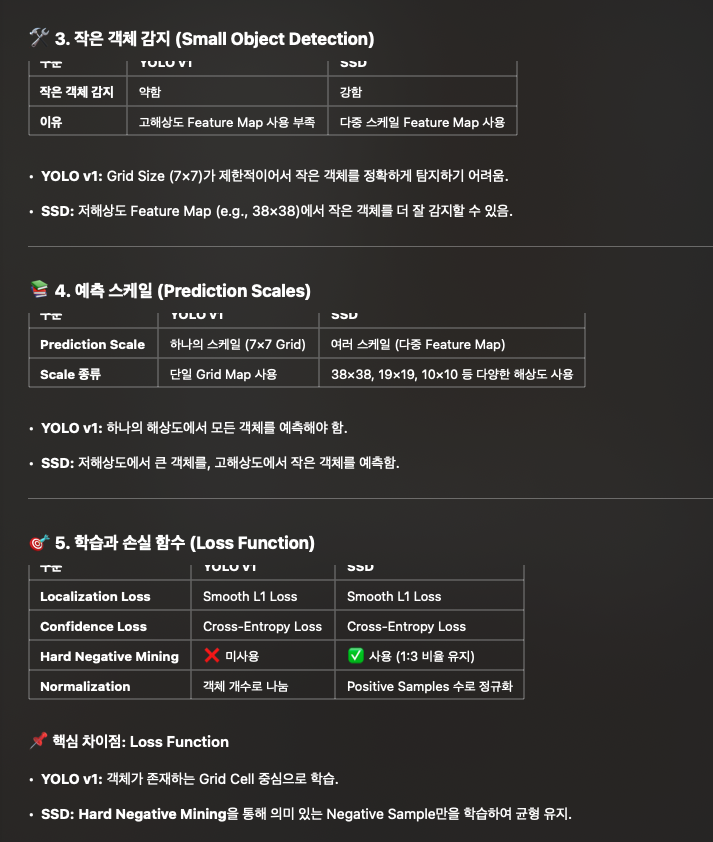
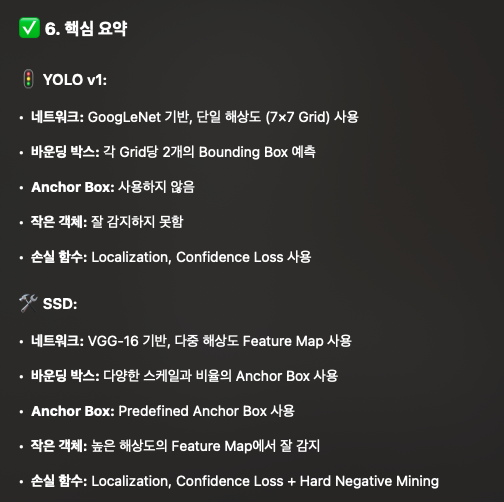
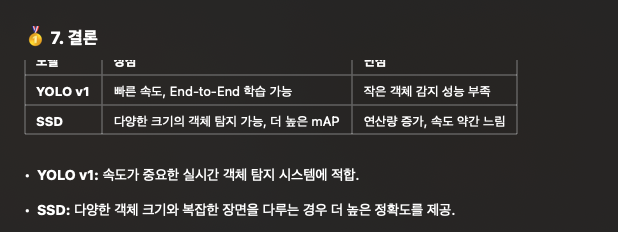